# Projet Chaos

## Modules

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.markers import MarkerStyle
from scipy import optimize
from scipy.integrate import solve_ivp


plt.rcParams.update({"font.size":20})
pwd = "/Users/mickaelcarrier/Documents/École/Université/Bacc en physique/Session 6/Chaos/Projet/Images/"

## Fonctions

Basées sur les équations de l'article de Bindschadler et Sneyd, 2001.

In [2]:
# Définition des constantes utilisées
kf = 28 # uM/s
Vp = 1.2 # uM/s
R5 = 1.6 # uM
R3 = 50 # uM
r2 = 100 # 1/uMs
R1 = 6 # uM
leak = 0.2 # uM/s
Kp = 0.18 # uM
k2 = 26.5 # uM/s
k1 = 44 # uM/s 
r4 = 20 # 1/s
k3 = 1.6 # uM/s


# Fonctions de bases
def phi_1(conc):
    """
        Calcul du taux phi_1, en fonction de la concentration du calcium.
    Args :
        Conc : Concentration de calcium
    Returns :
        0 : Fonction
        1 : Dérivée
    """
    return (r2*conc)/(R1+conc), (r2*R1) / (R1+conc)**2

def phi_m1(conc):
    """
        Calcul du taux phi_-1, en fonction de la concentration du calcium.
    Args :
        Conc : Concentration de calcium
    Returns :
        0 : Fonction
        1 : Dérivée
    """
    return k1/(R3+conc), -k1 / (R3+conc)**2

def phi_2(conc):
    """
        Calcul du taux phi_2, en fonction de la concentration du calcium.
    Args :
        Conc : Concentration de calcium
    Returns :
        0 : Fonction
        1 : Dérivée
    """
    return (k2 + r4*conc)/(R3+conc), (R3*r4 - k2) / (R3+conc)**2

def phi_3(conc):
    """
        Calcul du taux phi_3, en fonction de la concentration du calcium.
    Args :
        Conc : Concentration de calcium
    Returns :
        0 : Fonction
        1 : Dérivée
    """
    return k3/(R5+conc), -k3 / (R5+conc)**2

def pump(conc):
    """
        Calcul du taux de calcium étant pompé dans la cellule.
    Args :
        Conc : Concentration de calcium
    Returns :
        0 : Fonction
        1 : Dérivée
    """
    return (Vp * conc**2)/(Kp**2 + conc**2), (2*Vp * Kp**2 * conc) / (Kp**2 + conc**2)**2

# Fonctions combinées
def recept(p, h, conc):
    """
        Calcul du taux de calcium qui entre dans la cellule par un récepteur InsP3 du réticulum endoplasmique.
    Args :
        p : Concentration d'InsP3
        h : Fraction des récepteurs ouverts ou fermés
        Conc : Concentration de calcium
    Returns :
        0 : Fonction
        1 : Dérivée p/r conc
        2 : Dérivée p/r h
    """
    paren = (p*h*phi_1(conc)[0]) / (phi_1(conc)[0]*p + phi_m1(conc)[0])
    fonc = kf * paren**4
    d_dc = 4 * kf * paren**3 * ((p*h * (phi_m1(conc)[0]*phi_1(conc)[1] - phi_1(conc)[0]*phi_m1(conc)[1])) / (phi_1(conc)[0]*p + phi_m1(conc)[0])**2)
    d_dh = 4 * kf * paren**3 * (p*phi_1(conc)[0]) / (phi_1(conc)[0]*p + phi_m1(conc)[0])
    return fonc, d_dc, d_dh

def InsP3(p, h, conc):
    """
        Équation différentielle d'ordre 1 décrivant la fraction de récepteurs InsP3 ouverts ou fermés.
    Args :
        p : Concentration d'InsP3
        h : Fraction des récepteurs ouverts ou fermés
        Conc : Concentration de calcium
    Returns :
        0 : Fonction
        1 : Dérivée p/r conc
        2 : Dérivée p/r h
    """
    fonc = phi_3(conc)[0]*(1-h) - ((phi_1(conc)[0]*phi_2(conc)[0]*h*p)/(phi_1(conc)[0]*p + phi_m1(conc)[0]))
    d_dc = phi_3(conc)[1]*(1-h) - ((h*p*(phi_m1(conc)[0]*phi_2(conc)[0]*phi_1(conc)[1] +
                                        (phi_1(conc)[0]**2)* phi_2(conc)[1]*p + phi_m1(conc)[0]*phi_1(conc)[0]*phi_2(conc)[1]
                                        - phi_1(conc)[0]*phi_2(conc)[0]*phi_m1(conc)[1])) / (phi_1(conc)[0]*p + phi_m1(conc)[0])**2)
    d_dh = - phi_3(conc)[0] - ((phi_1(conc)[0]*phi_2(conc)[0]*p) / (phi_1(conc)[0]*p + phi_m1(conc)[0]))
    return fonc, d_dc, d_dh

# Fonctions pour une seule cellule
def one_cell_conc(p, h, conc):
    """
        Équation différentielle d'ordre 1 décrivant la variation de concentration du calcium dans une seule cellule.
    Args :
        p : Concentration d'InsP3
        h : Fraction des récepteurs ouverts ou fermés
        Conc : Concentration de calcium
    Returns :
        0 : Fonction
        1 : Dérivée p/r conc
        2 : Dérivée p/r h
    """
    fonc = recept(p, h, conc)[0] - pump(conc)[0] + leak
    d_dc = recept(p, h, conc)[1] - pump(conc)[1]
    d_dh = recept(p, h, conc)[2]
    return fonc, d_dc, d_dh

def system_one_cell(t, y, p):
    """
        Système EDO d'ordre 1 décrivant la variation de concentration du calcium dans une seule cellule.
    Args :
        t : temps
        y : tuple (h, concentration)
        p : Concentration d'InsP3
    Returns :
        0 : Système
    """
    h, conc = y
    dc_dt = one_cell_conc(p, h, conc)[0]
    dh_dt = InsP3(p, h, conc)[0]
    return [dh_dt, dc_dt]

def points_fixes_one_cell(sol, p):
    '''
        Calcul des points fixes.
    Args : 
        Sol : Solution du système d'EDO.
        p : Concentration d'InsP3.
    Returns :
        Points fixes.
    '''
    t_values = np.linspace(*t_span, 100000)
    x_values, y_values = sol.sol(t_values)
    dx_dt_values, dy_dt_values = system_one_cell(t_values, [x_values, y_values], p)
    indices_points_fixes = np.where((np.abs(dx_dt_values) < 1e-11) & (np.abs(dy_dt_values) < 1e-11))
    return x_values[indices_points_fixes], y_values[indices_points_fixes]

def points_one_cell(sol, p):
    '''
        Calcul des points.
    Args : 
        Sol : Solution du système d'EDO.
        p : Concentration d'InsP3.
    Returns :
        Points (t, x, y).
    '''
    t_values = np.linspace(*t_span, 100000)
    x_values, y_values = sol.sol(t_values)
    # dx_dt_values, dy_dt_values = system(t_values, [x_values, y_values], p)
    return t_values, x_values, y_values

# Fonctions pour deux cellules
def diff_two_cells(D, conc1, conc2):
    """
        Calcul du taux de calcium étant pompé diffusé entre les deux .
    Args :
        D : Constante de proportionnalité, si 0 --> cellules sans interaction
        Conc1 : Concentration de calcium dans la cellule 1
        Conc2 : Concentration de calcium dans la cellule 2
    Returns :
        0 : Fonction
        1 : Dérivée p/r conc1
        2 : Dérivée p/r conc2
    """
    fonc =  D*(conc2-conc1)
    d_dc1 = -D
    d_dc2 = D
    return fonc, d_dc1, d_dc2

def two_cells_conc(p, h, conc1, conc2, D):
    """
        Équation différentielle d'ordre 1 décrivant la variation de concentration du calcium dans une seule cellule.
    Args :
        p : Concentration d'InsP3
        h : Fraction des récepteurs ouverts ou fermés 
        Conc1 : Concentration de calcium dans la cellule 1
        Conc2 : Concentration de calcium dans la cellule 2
        D : Constante de proportionnalité, si 0 --> cellules sans interaction
    Returns :
        0 : Fonction
        1 : Dérivée p/r conc1
        2 : Dérivée p/r h
        3 : Dérivée p/r conc2
    """
    fonc = recept(p, h, conc1)[0] - pump(conc1)[0] + leak + diff_two_cells(D, conc1, conc2)[0]
    d_dc1 = recept(p, h, conc1)[1] - pump(conc1)[1] + diff_two_cells(D, conc1, conc2)[1]
    d_dh = recept(p, h, conc1)[2]
    d_dc2 = diff_two_cells(D, conc1, conc2)[2]
    return fonc, d_dc1, d_dh, d_dc2

def system_two_cell(t, y, p):
    """
        Système EDO d'ordre 1 décrivant la variation de concentration du calcium dans une seule cellule.
    Args :
        t : temps
        y : tuple (h1, concentration1, h2, concentration2)
        p : Concentration d'InsP3
    Returns :
        0 : Système
    """
    h1, conc1, h2, conc2 = y
    dc_dt1 = two_cells_conc(p, h1, conc1, conc2, D)[0]
    dh_dt1 = InsP3(p, h1, conc1)[0]
    dc_dt2 = two_cells_conc(p, h2, conc2, conc1, D)[0]
    dh_dt2 = InsP3(p, h2, conc2)[0]
    return [dh_dt1, dc_dt1, dh_dt2, dc_dt2]

def points_fixes_two_cell(sol, p):
    '''
        Calcul des points fixes.
    Args : 
        Sol : Solution du système d'EDO.
        p : Concentration d'InsP3.
    Returns :
        Points fixes.
    '''
    t_values = np.linspace(*t_span, 100000)
    x1_values, y1_values, x2_values, y2_values = sol.sol(t_values)
    dx_dt1_values, dy_dt1_values, dx_dt2_values, dy_dt2_values = system_two_cell(t_values, [x1_values, y1_values, x2_values, y2_values], p)
    indices_points_fixes = np.where((np.abs(dx_dt1_values) < 1e-11) & (np.abs(dy_dt1_values) < 1e-11) & (np.abs(dx_dt2_values) < 1e-11) & (np.abs(dy_dt2_values) < 1e-11))
    return x1_values[indices_points_fixes], y1_values[indices_points_fixes], x2_values[indices_points_fixes], y2_values[indices_points_fixes]

def points_two_cell(sol):
    '''
        Calcul des points.
    Args : 
        Sol : Solution du système d'EDO.
        p : Concentration d'InsP3.
    Returns :
        Points (temps, h1, conc1, h2, conc2)
    '''
    t_values = np.linspace(*t_span, 100000)
    x1_values, y1_values, x2_values, y2_values = sol.sol(t_values)
    # dx_dt1_values, dy_dt1_values, dx_dt2_values, dy_dt2_values = system_two_cell(t_values, [x1_values, y1_values, x2_values, y2_values], p)
    return t_values, x1_values, y1_values, x2_values, y2_values

## Une cellule

Modifier les conditions initiales pour vérifier les résultats. Conditions initiales --> lignes 2, valeurs de p --> ligne 13.
Modifier la densité du streamplot afin de bien voir le portrait de phase --> ligne 50.
Mettre les trajectoires en commentraire pour voir seulement le portrait de phase --> Lignes 52 et 53.

Manque diagramme de bifurcation...
Gérer les couleurs et l'affichage des graphiques


Résultats :
1. Un seul point fixe (node stable) pour p < 0.24 ;
2. Un cycle limite (stable) et un point fixe (centre) pour 0.24 < p < 2.7 et p > 2.7 (bifurcation homoclinique?); À vérifier
3. Deux cycles limites (stable et instable) et un point fixe (centre) pour p = 0.27 ish ; À vérifier
4. Les points 1, 2, 3 présente une bifurcation comme attendu, voir article de Bindschadler et Sneyd, 2001.

Points fixes trouvés :
h = 0.8173968924419412, conc = 0.12791921091624447
h = 0.817396892441725, conc = 0.1279192109164963
h = 0.8173968924415088, conc = 0.1279192109167481
h = 0.8173968924412927, conc = 0.1279192109169999
h = 0.8173968924410765, conc = 0.12791921091725164
h = 0.8173968924408603, conc = 0.12791921091750336
h = 0.8173968924406443, conc = 0.12791921091775504
h = 0.8173968924404282, conc = 0.12791921091800668
h = 0.8173968924402122, conc = 0.1279192109182583
h = 0.8173968924399962, conc = 0.1279192109185099
h = 0.8173968924397802, conc = 0.12791921091876146
h = 0.8173968924395643, conc = 0.127919210919013
h = 0.8173968924393483, conc = 0.1279192109192645
h = 0.8173968924391324, conc = 0.127919210919516
h = 0.8173968924389166, conc = 0.12791921091976743
h = 0.8173968924387007, conc = 0.12791921092001884
h = 0.8173968924384849, conc = 0.12791921092027025
h = 0.8173968924382691, conc = 0.1279192109205216
h = 0.8173968924380532, conc = 0.12791921092077294
h = 0.81739689243783

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Amplitude = 3.5707093809511647e-09 et 4.4826146863852223e-07
Moyenne = 0.1279192110470012 et 0.12791925749539756


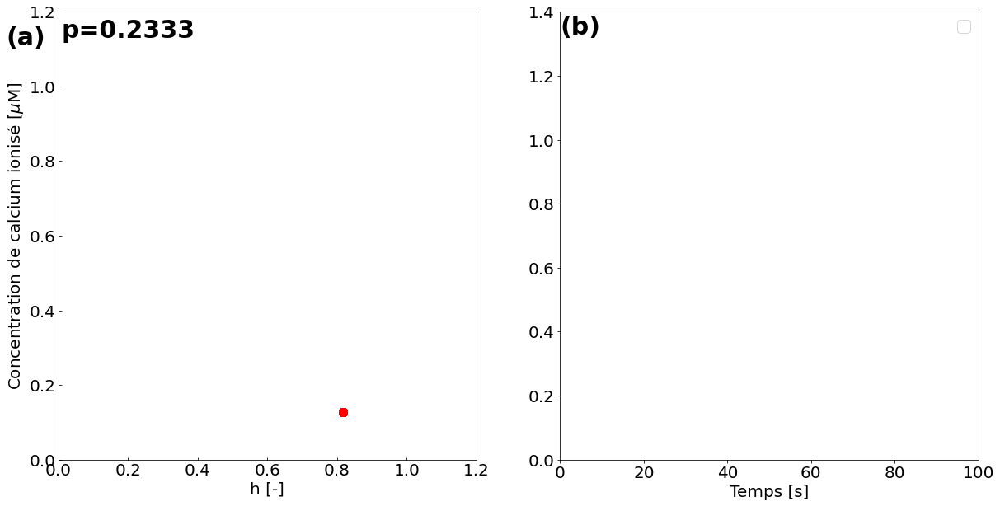

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Points fixes trouvés :
Delta = 0.32548258168133765
tau = 2.3947891012371922
Amplitude = 0.549773452535417 et 0.5497736552037972
Moyenne = 0.6844379074255353 et 0.684441198959595


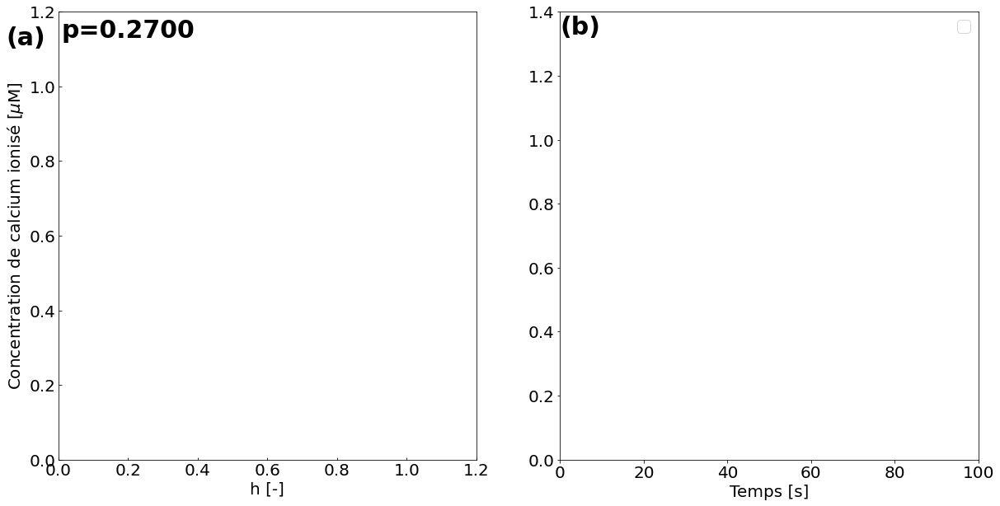

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Points fixes trouvés :
h = 0.5827161103569889, conc = 0.5436432327293248
h = 0.5827161103559348, conc = 0.5436432327315681
h = 0.5827161103548809, conc = 0.5436432327338112
h = 0.582716110353827, conc = 0.5436432327360542
h = 0.5827161103527733, conc = 0.543643232738297
h = 0.5827161103517196, conc = 0.5436432327405395
h = 0.582716110363452, conc = 0.5436432326836974
h = 0.582716110363877, conc = 0.5436432326827921
h = 0.5827161103643022, conc = 0.5436432326818869
h = 0.5827161103647274, conc = 0.5436432326809817
h = 0.5827161103651525, conc = 0.5436432326800765
h = 0.5827161103655776, conc = 0.5436432326791714
h = 0.5827161103660027, conc = 0.5436432326782663
h = 0.5827161103664277, conc = 0.5436432326773611
h = 0.5827161103668528, conc = 0.5436432326764561
h = 0.5827161103672779, conc = 0.543643232675551
h = 0.5827161103677029, conc = 0.543643232674646
h = 0.5827161103681279, conc = 0.5436432326737409
h = 0.582716110368553, conc = 0.543643232672836
h = 0.582716110368978, conc = 0.543

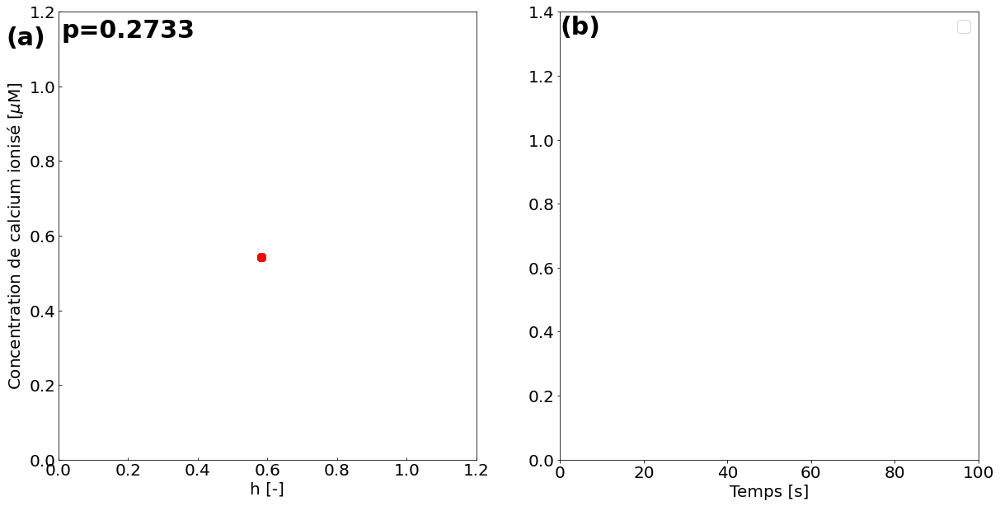

Points fixes trouvés :
h = 0.5779983253886517, conc = 0.553978313125451
h = 0.5779983253882585, conc = 0.5539783131263395
h = 0.5779983253878652, conc = 0.553978313127228
h = 0.577998325387472, conc = 0.5539783131281164
h = 0.5779983253870787, conc = 0.5539783131290047
h = 0.5779983253866856, conc = 0.5539783131298929
h = 0.5779983253862925, conc = 0.5539783131307809
h = 0.5779983253858995, conc = 0.553978313131669
h = 0.5779983253855064, conc = 0.553978313132557
h = 0.5779983253851134, conc = 0.5539783131334448
h = 0.5779983253847204, conc = 0.5539783131343327
h = 0.5779983253843275, conc = 0.5539783131352204
h = 0.5779983253839346, conc = 0.553978313136108
h = 0.5779983253835418, conc = 0.5539783131369955
h = 0.577998325383149, conc = 0.5539783131378829
h = 0.5779983253785123, conc = 0.553978313160929
h = 0.5779983253786941, conc = 0.5539783131605195
h = 0.577998325378876, conc = 0.55397831316011
h = 0.5779983253790578, conc = 0.5539783131597005
h = 0.5779983253792397, conc = 0.55397

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Amplitude = 7.918118319905076e-07 et 0.5140426892072818
Moyenne = 0.5539781915983497 et 0.6744792034372096


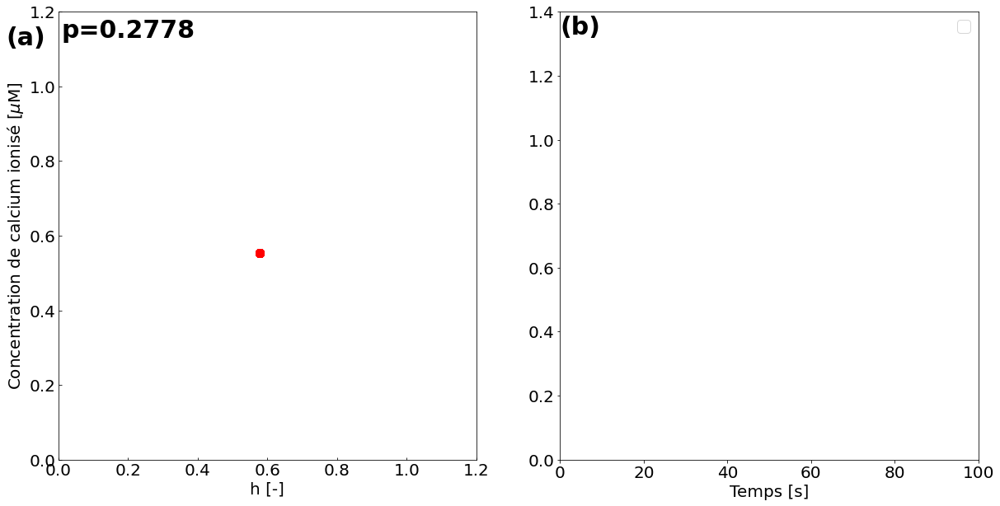

Points fixes trouvés :
h = 0.5594632184392704, conc = 0.5944416072886924
h = 0.5594632184392276, conc = 0.594441607288793
h = 0.559463218439185, conc = 0.5944416072888936
h = 0.5594632184391423, conc = 0.5944416072889941
h = 0.5594632184390995, conc = 0.5944416072890947
h = 0.5594632184390569, conc = 0.5944416072891952
h = 0.5594632184390141, conc = 0.5944416072892957
h = 0.5594632184389715, conc = 0.5944416072893962
h = 0.5594632184389288, conc = 0.5944416072894967
h = 0.5594632184388861, conc = 0.5944416072895973
h = 0.5594632184388435, conc = 0.5944416072896977
h = 0.5594632184388008, conc = 0.5944416072897982
h = 0.5594632184387581, conc = 0.5944416072898987
h = 0.5594632184387155, conc = 0.5944416072899991
h = 0.5594632184386729, conc = 0.5944416072900995
h = 0.5594632184386301, conc = 0.5944416072902
h = 0.5594632184385875, conc = 0.5944416072903004
h = 0.5594632184385449, conc = 0.5944416072904009
h = 0.5594632184385022, conc = 0.5944416072905012
h = 0.5594632184384596, conc = 0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



h = 0.5594632184370294, conc = 0.5944416072928056
h = 0.559463218437033, conc = 0.5944416072927956
h = 0.5594632184370365, conc = 0.5944416072927856
h = 0.5594632184370402, conc = 0.5944416072927757
Delta = 1.3915201810774216
tau = -0.2569208262488816
Amplitude = 4.431995070941497e-08 et 6.046687178740129e-08
Moyenne = 0.5944416472104591 et 0.594441607142518


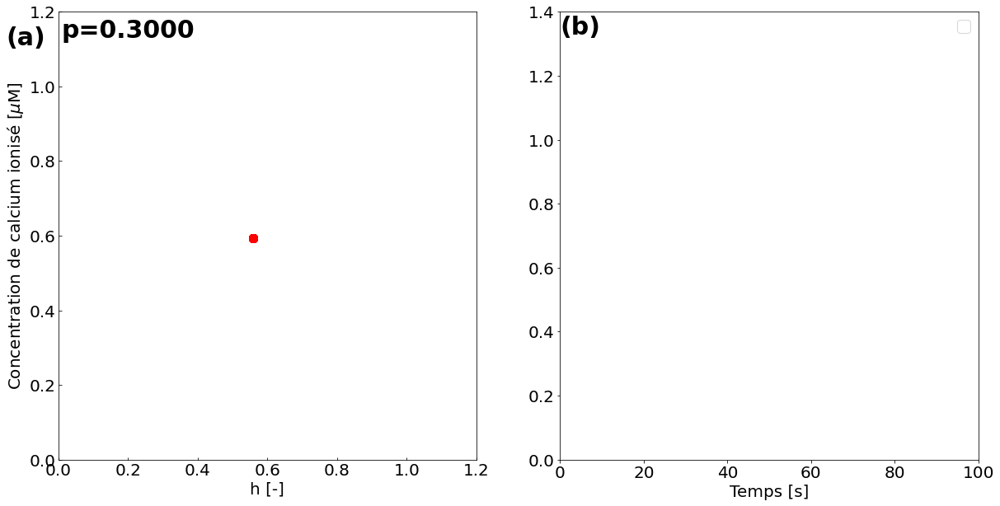

In [11]:
# Résolution problème aux valeurs initiales
initial_conditions1 = [0.6, 0.5]  # Conditions initiales [# porte ouverte/fermée, conc Ca]
initial_conditions2 = [0.2, 0.8]
t_span = [0, 10000]  # Plage de temps

# Limites du portrait de phase
xmax, ymax = 1.2, 1.2

# Meshgrid
h, conc = np.meshgrid(np.linspace(0,xmax,400), np.linspace(0,ymax,400))

# Figures pour différentes valeurs de p
for p in [0.2333, 0.27, 0.2733, 0.2778, 0.3] : # np.linspace(0.27, 0.28, 10) [0.1, 0.2333, 0.2733, 0.2756, 0.2778, 0.3] 

    # Équations différentielles
    dc_dt, dh_dt = one_cell_conc(p, h, conc)[0], InsP3(p, h, conc)[0]

    # Trajectoire 1
    sol = solve_ivp(system_one_cell, t_span, initial_conditions1, dense_output=True, args=[p], method="Radau")
    h_fixes, conc_fixes = points_fixes_one_cell(sol, p)
    temps, h_val, conc_val = points_one_cell(sol, p)

    # Trajectoire 2
    sol2 = solve_ivp(system_one_cell, t_span, initial_conditions2, dense_output=True, args=[p], method="Radau")
    h_fixes2, conc_fixes2 = points_fixes_one_cell(sol2, p)
    temps2, h_val2, conc_val2 = points_one_cell(sol2, p)    

    # Portrait de phases
    fig1, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.set_xlabel('h [-]')
    ax1.set_ylabel(r'Concentration de calcium ionisé [$\mu$M]')
    ax1.set_xlim(0,xmax)
    ax1.set_ylim(0,ymax)
    # ax1.streamplot(h, conc, dh_dt, dc_dt, broken_streamlines=False, density=1, color="gray")
    ax1.tick_params(direction="in")
    # ax1.plot(h_val, conc_val, color="black", lw=2) # À mettre en commentaire
    # ax1.plot(h_val2, conc_val2, color="red", lw=2) # À mettre en commentaire
    ax1.text(0.01, 1.13, f"p={p:.4f}", fontweight='bold', fontsize=30)
    ax1.text(-0.15, 1.11, f"(a)", fontweight='bold', fontsize=30)
    print("Points fixes trouvés :")
    for h_fix, conc_fix in zip(h_fixes, conc_fixes):
        print(f"h = {h_fix}, conc = {conc_fix}")
        ax1.scatter(h_fix, conc_fix, color="red", s=100)

    # Stabilité
    if len(h_fixes) != 0:
        jac = np.array([[one_cell_conc(p, h_fixes[-1], conc_fixes[-1])[1], one_cell_conc(p, h_fixes[-1], conc_fixes[-1])[2]],
                    [InsP3(p, h_fixes[-1], conc_fixes[-1])[1], InsP3(p, h_fixes[-1], conc_fixes[-1])[2]]])
    else :
        jac = np.array([[one_cell_conc(p, h_val[-1], conc_val[-1])[1], one_cell_conc(p, h_val[-1], conc_val[-1])[2]],
                    [InsP3(p, h_val[-1], conc_val[-1])[1], InsP3(p, h_val[-1], conc_val[-1])[2]]])
    det = np.linalg.det(jac)
    tau = np.trace(jac)
    print(f"Delta = {det}\ntau = {tau}")

    # Concentration en fonction du temps
    # ax2.plot(temps, conc_val, label="Scénario 1", lw=2, color="black")
    # ax2.plot(temps2, conc_val2, label="Scénario 2", lw=2, color="red")
    Amplitude1 = (max(conc_val[2000:]) - min(conc_val[2000:]))/2
    Moyenne1 = (max(conc_val[2000:]) + min(conc_val[2000:]))/2
    Amplitude2 = (max(conc_val2[2000:]) - min(conc_val2[2000:]))/2
    Moyenne2 = (max(conc_val2[2000:]) + min(conc_val2[2000:]))/2
    print(f"Amplitude = {Amplitude1} et {Amplitude2}")
    print(f"Moyenne = {Moyenne1} et {Moyenne2}")
    ax2.set_xlim(0,100)
    ax2.set_xlabel('Temps [s]')
    ax2.text(0, 1.33, f"(b)", fontweight='bold', fontsize=30)
    ax2.set_ylim(0,1.4)
    # ax2.set_ylabel('Concentration calcium [uM]')
    ax2.legend(loc="upper right")
    # plt.savefig(pwd + f"Cellules non couplées p={p}.pdf", format="pdf")
    plt.show()

## Deux cellules

Modifier les conditions initiales pour vérifier les résultats. Conditions initiales --> lignes 2, valeur de D --> ligne 14, valeurs de p --> ligne 15.

Selon les conditions frontières ça plante ou non...

Résultats :
1. Mêmes conclusions que une cellule (D=0) ;
2. Plus de points fixes, jusqu'à 9 possibles puisque chaque cellule en a 3.


Points fixes trouvés, graph1 :
h1 = 0.8173968924334011, conc1 = 0.12791921092395175
h1 = 0.8173968924333996, conc1 = 0.12791921092395328
h1 = 0.8173968924333982, conc1 = 0.1279192109239548
h1 = 0.8173968924333969, conc1 = 0.12791921092395636
h1 = 0.8173968924333954, conc1 = 0.1279192109239579
h1 = 0.817396892433394, conc1 = 0.12791921092395941
h1 = 0.8173968924333925, conc1 = 0.12791921092396097
h1 = 0.8173968924333912, conc1 = 0.1279192109239625
h1 = 0.8173968924333898, conc1 = 0.12791921092396402
h1 = 0.8173968924333883, conc1 = 0.12791921092396558
h1 = 0.8173968924333869, conc1 = 0.1279192109239671
h1 = 0.8173968924333855, conc1 = 0.12791921092396863
h1 = 0.8173968924333841, conc1 = 0.12791921092397016
h1 = 0.8173968924333826, conc1 = 0.1279192109239717
h1 = 0.8173968924333812, conc1 = 0.12791921092397324
h1 = 0.8173968924333799, conc1 = 0.12791921092397476
h1 = 0.8173968924333784, conc1 = 0.1279192109239763
h1 = 0.817396892433377, conc1 = 0.12791921092397784
h1 = 0.8173968924333755

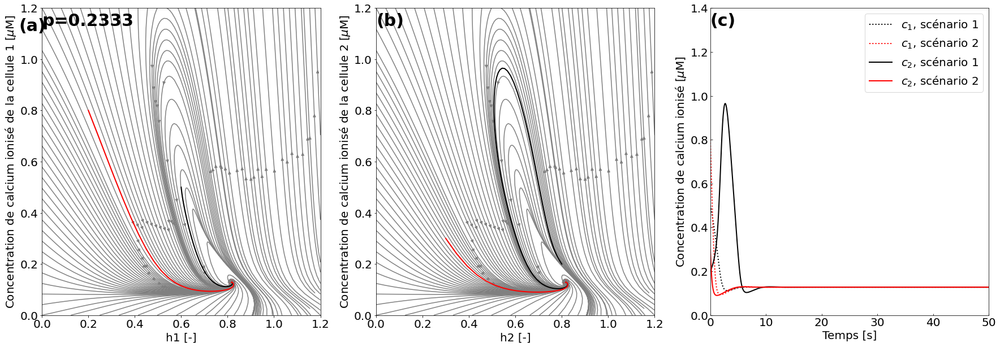

Points fixes trouvés, graph1 :
Points fixes trouvés, graph2 :
Delta = 0.32781688537007814
tau = 0.026839065000546114
Amplitude cell1 = 0.5497699299089975 et 0.5497748730821157
Moyenne cell1 = 0.6844416681874108 et 0.6844382739269155
Amplitude = 0.5505462758104905 et 0.5497748730802219
Moyenne = 0.6849914382031778 et 0.6844382739256338


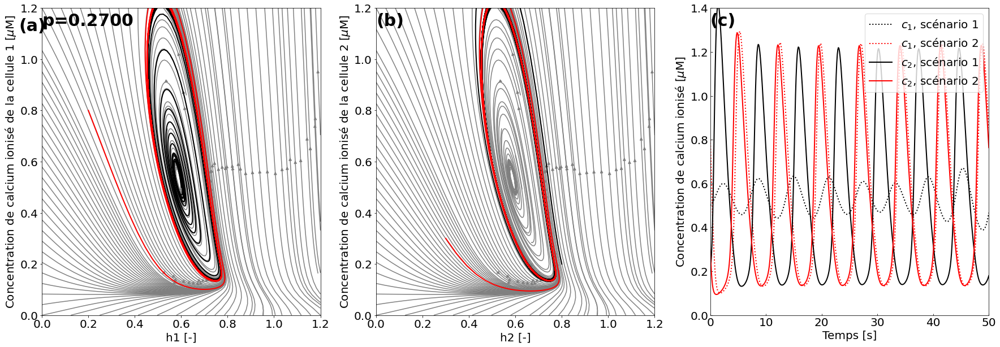

Points fixes trouvés, graph1 :
Points fixes trouvés, graph2 :
Delta = 1.1086395295526534
tau = -0.04542297032453302
Amplitude cell1 = 0.035250520141011266 et 0.5413773887795903
Moyenne cell1 = 0.5425289313715485 et 0.6838331618233722
Amplitude = 0.5286432484082902 et 0.5413096539207141
Moyenne = 0.6765467156188926 et 0.6837654269504392


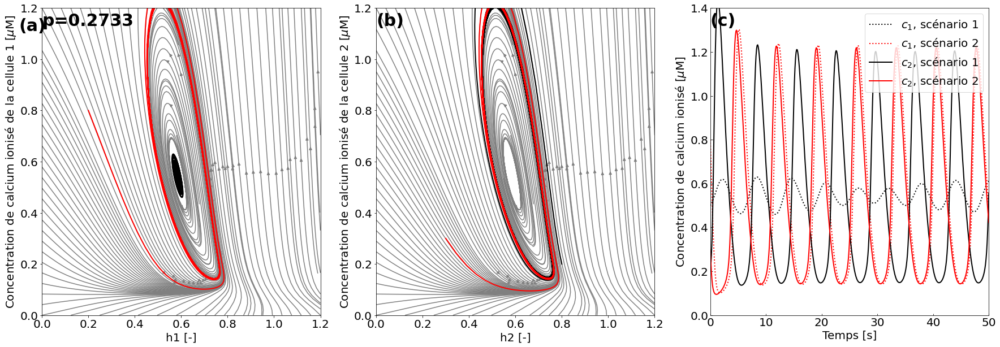

Points fixes trouvés, graph1 :
Points fixes trouvés, graph2 :
Delta = 1.2076083672902924
tau = -0.06428012147401652
Amplitude cell1 = 0.020655379990553835 et 0.5143534253079542
Moyenne cell1 = 0.5529460624548603 et 0.6746737699076761
Amplitude = 0.4900534754106844 et 0.5140518797681576
Moyenne = 0.6621042339514622 et 0.6744607085956867


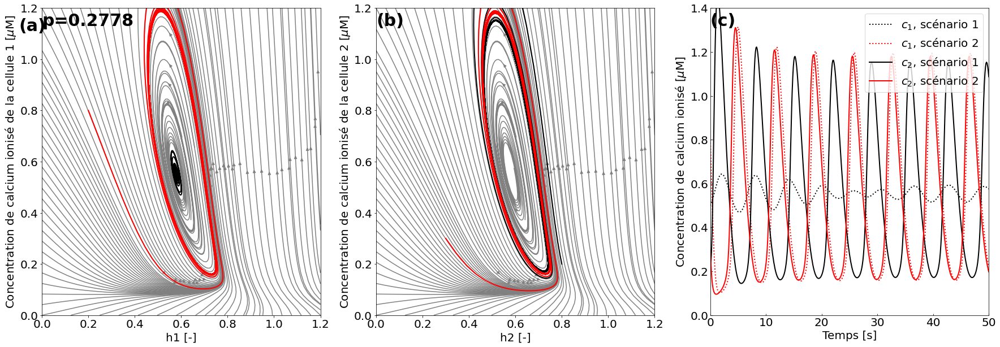

Points fixes trouvés, graph1 :
h1 = 0.5594632184371524, conc1 = 0.5944416072925706
h1 = 0.5594632184371534, conc1 = 0.5944416072925705
h1 = 0.5594632184371544, conc1 = 0.5944416072925705
h1 = 0.5594632184371553, conc1 = 0.5944416072925703
h1 = 0.5594632184371563, conc1 = 0.5944416072925702
h1 = 0.5594632184371572, conc1 = 0.5944416072925702
h1 = 0.5594632184371582, conc1 = 0.5944416072925701
h1 = 0.5594632184371591, conc1 = 0.59444160729257
h1 = 0.5594632184371601, conc1 = 0.59444160729257
h1 = 0.5594632184371611, conc1 = 0.5944416072925699
h1 = 0.559463218437162, conc1 = 0.5944416072925698
h1 = 0.559463218437163, conc1 = 0.5944416072925697
h1 = 0.5594632184371638, conc1 = 0.5944416072925697
h1 = 0.5594632184371648, conc1 = 0.5944416072925696
h1 = 0.5594632184371657, conc1 = 0.5944416072925695
h1 = 0.5594632184371667, conc1 = 0.5944416072925695
h1 = 0.5594632184371676, conc1 = 0.5944416072925693
h1 = 0.5594632184371686, conc1 = 0.5944416072925692
h1 = 0.5594632184371696, conc1 = 0.5944

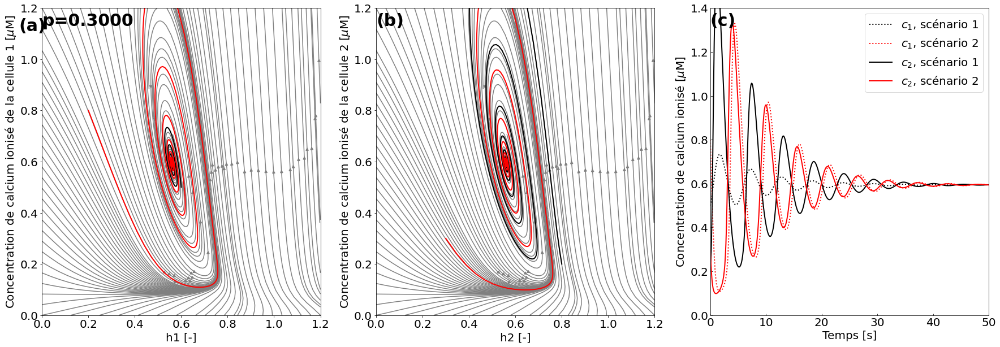

In [10]:
# Résolution problème aux valeurs initiales
initial_conditions1 = [0.6, 0.5, 0.8, 0.2]  # Conditions initiales [# porte ouverte/fermée, conc Ca] 
initial_conditions2 = [0.2, 0.8, 0.3, 0.3]
t_span = [0, 10000]  # Plage de temps

# Limites du portrait de phase
xmax, ymax = 1.2, 1.2

# Meshgrid
h1, conc1 = np.meshgrid(np.linspace(0,xmax,400), np.linspace(0,ymax,400))
h2, conc2 = np.meshgrid(np.linspace(0,xmax,400), np.linspace(0,ymax,400))

# Figures pour différentes valeurs de p
D = 0.01
for p in [0.2333, 0.27, 0.2733, 0.2778, 0.3] : # np.linspace(0.23,0.29,10):  [0.1, 0.2, 0.25, 0.2767, 0.3]

    # Équations différentielles
    dc_dt1, dh_dt1 = two_cells_conc(p, h1, conc1, conc2, D)[0], InsP3(p, h1, conc1)[0]
    dc_dt2, dh_dt2 = two_cells_conc(p, h2, conc2, conc1, D)[0], InsP3(p, h2, conc2)[0]

    # Trajectoire 1
    sol = solve_ivp(system_two_cell, t_span, initial_conditions1, dense_output=True, args=[p], method="Radau")
    h1_fixes, conc1_fixes, h2_fixes, conc2_fixes = points_fixes_two_cell(sol, p)
    temps, h1_val, conc1_val, h2_val, conc2_val = points_two_cell(sol)

    # Trajectoire 2
    sol2 = solve_ivp(system_two_cell, t_span, initial_conditions2, dense_output=True, args=[p], method="Radau")
    h1_fixes2, conc1_fixes2, h2_fixes2, conc2_fixes2 = points_fixes_two_cell(sol2, p)
    temps2, h1_val2, conc1_val2, h2_val2, conc2_val2 = points_two_cell(sol2)

    print("Points fixes trouvés, graph1 :")
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,10))
    for h1_fix, conc1_fix in zip(h1_fixes, conc1_fixes):
        print(f"h1 = {h1_fix}, conc1 = {conc1_fix}")
        ax1.scatter(h1_fix, conc1_fix, color="red", s=100)
    print("Points fixes trouvés, graph2 :")
    for h2_fix, conc2_fix in zip(h2_fixes, conc2_fixes):
        print(f"h2 = {h2_fix}, conc2 = {conc2_fix}")
        ax2.scatter(h2_fix, conc2_fix, color="red", s=100)

    # Stabilité
    if len(h1_fixes) != 0:
        jac = np.array([[two_cells_conc(p, h1_fixes[-1], conc1_fixes[-1], conc2_fixes[-1], D)[1], two_cells_conc(p, h1_fixes[-1], conc1_fixes[-1], conc2_fixes[-1], D)[2]],
                    [InsP3(p, h1_fixes[-1], conc1_fixes[-1])[1], InsP3(p, h1_fixes[-1], conc1_fixes[-1])[2]]])
    else :
        jac = np.array([[two_cells_conc(p, h1_val[-1], conc1_val[-1], conc2_val[-1], D)[1], two_cells_conc(p, h1_val[-1], conc1_val[-1], conc2_val[-1], D)[2]],
                    [InsP3(p, h1_val[-1], conc1_val[-1])[1], InsP3(p, h1_val[-1], conc1_val[-1])[2]]])
    det = np.linalg.det(jac)
    tau = np.trace(jac)
    print(f"Delta = {det}\ntau = {tau}")

    # Portrait de phase
    ax1.set_xlabel('h1 [-]')
    ax1.set_ylabel(r'Concentration de calcium ionisé de la cellule 1 [$\mu$M]')
    ax1.set_xlim(0,xmax)
    ax1.set_ylim(0,ymax)
    ax2.set_xlim(0,xmax)
    ax2.set_ylim(0,ymax)
    ax1.streamplot(h1,conc1,dh_dt1,dc_dt1, broken_streamlines=False, color="gray")
    ax1.plot(h1_val, conc1_val, color="black", lw=2)
    ax1.plot(h1_val2, conc1_val2, color="red", lw=2)
    plt.tick_params(direction="in")
    ax1.text(0, 1.13, f"p={p:.4f}", fontweight='bold', fontsize=30)
    ax2.set_xlabel('h2 [-]')
    ax2.set_ylabel(r'Concentration de calcium ionisé de la cellule 2 [$\mu$M]')
    ax2.streamplot(h2,conc2,dh_dt2,dc_dt2, broken_streamlines=False, color="gray")
    ax2.plot(h2_val, conc2_val, color="black", lw=2)
    ax2.plot(h2_val2, conc2_val2, color="red", lw=2)

    # Concentration en fonction du temps
    ax3.set_xlabel('Temps [s]')
    ax3.set_ylabel(r'Concentration de calcium ionisé [$\mu$M]')
    ax3.plot(temps, conc1_val, label=r"$c_1$, scénario 1", color="black", linestyle=":", lw=2)
    ax3.plot(temps2, conc1_val2, label=r"$c_1$, scénario 2", color="red", linestyle=":", lw=2)
    ax3.set_xlim(0,50)
    ax3.set_ylim(0,1.4)
    ax1.text(-0.1, 1.11, f"(a)", fontweight='bold', fontsize=30)
    ax2.text(0, 1.13, f"(b)", fontweight='bold', fontsize=30)
    ax3.text(0, 1.32, f"(c)", fontweight='bold', fontsize=30)
    ax3.plot(temps, conc2_val, label=r"$c_2$, scénario 1", color="black", lw=2)
    ax3.plot(temps2, conc2_val2, label=r"$c_2$, scénario 2", color="red", lw=2)
    Amplitude11 = (max(conc1_val[2000:]) - min(conc1_val[2000:]))/2
    Moyenne11 = (max(conc1_val[2000:]) + min(conc1_val[2000:]))/2
    Amplitude12 = (max(conc1_val2[2000:]) - min(conc1_val2[2000:]))/2
    Moyenne12 = (max(conc1_val2[2000:]) + min(conc1_val2[2000:]))/2
    Amplitude21 = (max(conc2_val[2000:]) - min(conc2_val[2000:]))/2
    Moyenne21 = (max(conc2_val[2000:]) + min(conc2_val[2000:]))/2
    Amplitude22 = (max(conc2_val2[2000:]) - min(conc2_val2[2000:]))/2
    Moyenne22 = (max(conc2_val2[2000:]) + min(conc2_val2[2000:]))/2
    print(f"Amplitude cell1 = {Amplitude11} et {Amplitude12}")
    print(f"Moyenne cell1 = {Moyenne11} et {Moyenne12}")
    print(f"Amplitude = {Amplitude21} et {Amplitude22}")
    print(f"Moyenne = {Moyenne21} et {Moyenne22}")
    ax3.legend(loc="upper right")
    plt.savefig(pwd + f"Cellules faiblement couplée p={p}.pdf", format="pdf")
    plt.show()

C'est wack...

Points fixes trouvés, graph1 :
conc1 = 0.08206283317175826, conc2 = 0.08206289762682462
conc1 = 0.08206275588931168, conc2 = 0.0820628005223964
conc1 = 0.08206256185179629, conc2 = 0.082062919018764
conc1 = 0.0820627575719222, conc2 = 0.08206275791749845
conc1 = 0.08206289890196201, conc2 = 0.08206262049023327
conc1 = 0.0820627070544728, conc2 = 0.08206278468272693
conc1 = 0.0820626259271374, conc2 = 0.08206281183802122
conc1 = 0.0820629162624544, conc2 = 0.08206251703581019
conc1 = 0.08206258771584612, conc2 = 0.08206284033439086
conc1 = 0.08206273841268663, conc2 = 0.08206274588815134
conc1 = 0.08206265091731305, conc2 = 0.08206279642642302
conc1 = 0.08206291914852333, conc2 = 0.08206264443833962
conc1 = 0.08206278645761651, conc2 = 0.08206262065633475
conc1 = 0.08206263578330016, conc2 = 0.08206285914015773
conc1 = 0.0820625927438981, conc2 = 0.0820627322191116
conc1 = 0.08206289223989736, conc2 = 0.08206252366603752
conc1 = 0.08206259440042142, conc2 = 0.0820628131616962
conc1 = 0.

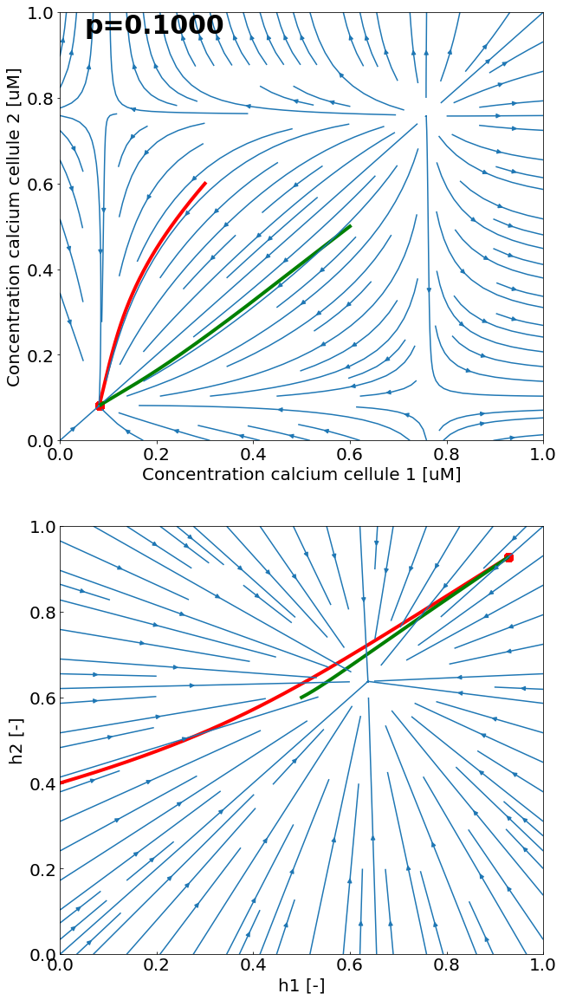

Points fixes trouvés, graph1 :
conc1 = 0.10007954038652264, conc2 = 0.10007945290304429
Points fixes trouvés, graph2 :
h1 = 0.8588007876725516, h2 = 0.8588007219809147


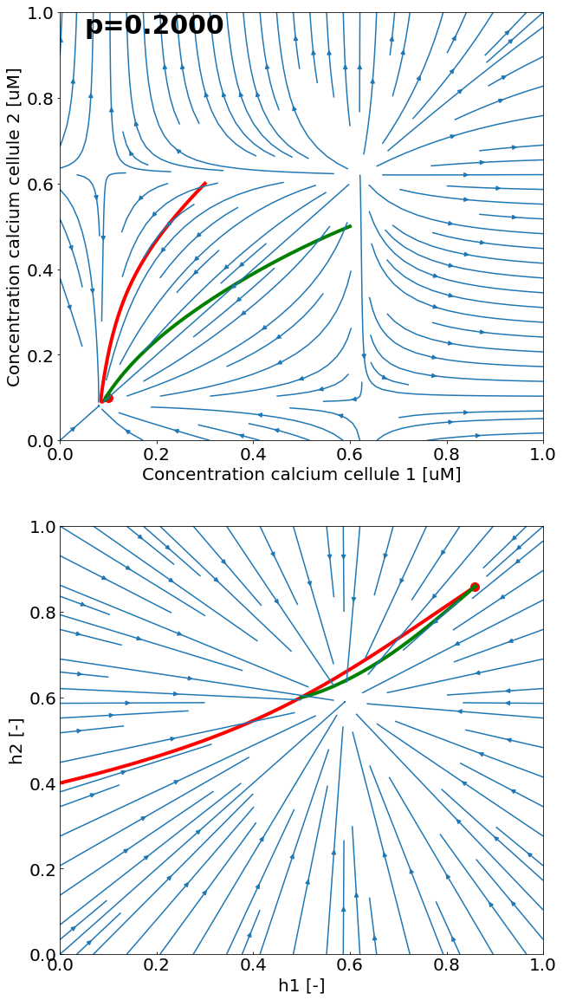

Points fixes trouvés, graph1 :
Points fixes trouvés, graph2 :


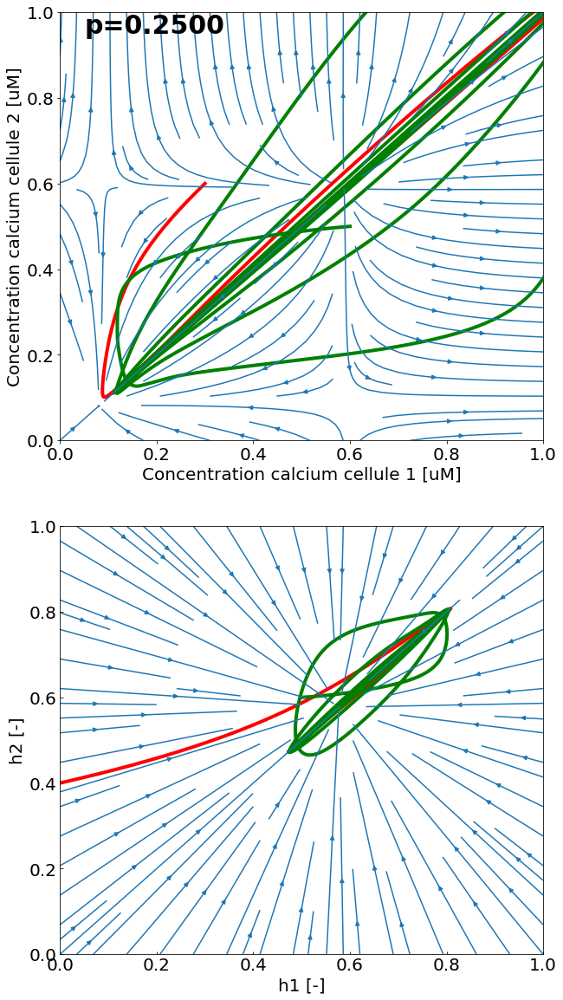

Points fixes trouvés, graph1 :
Points fixes trouvés, graph2 :


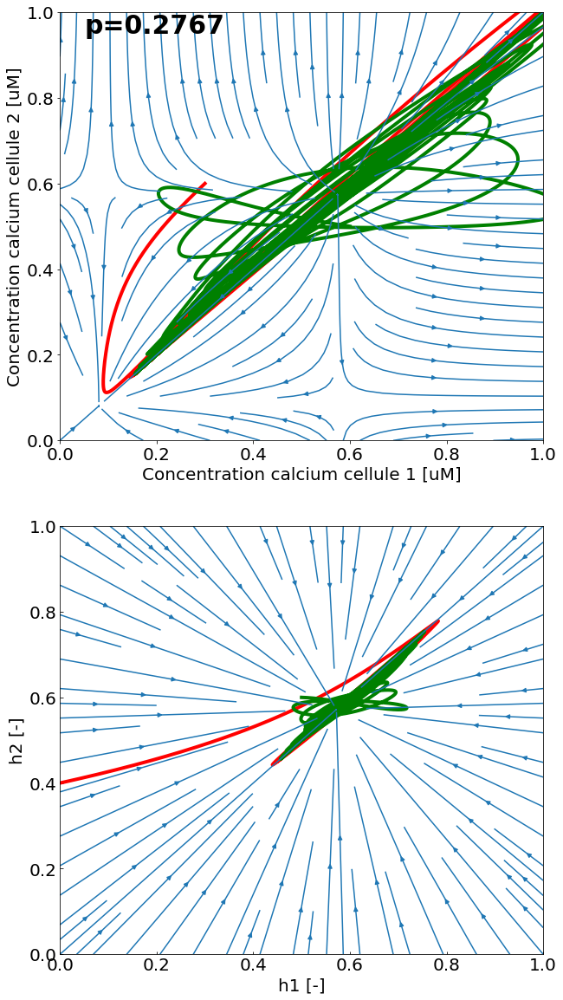

Points fixes trouvés, graph1 :
Points fixes trouvés, graph2 :


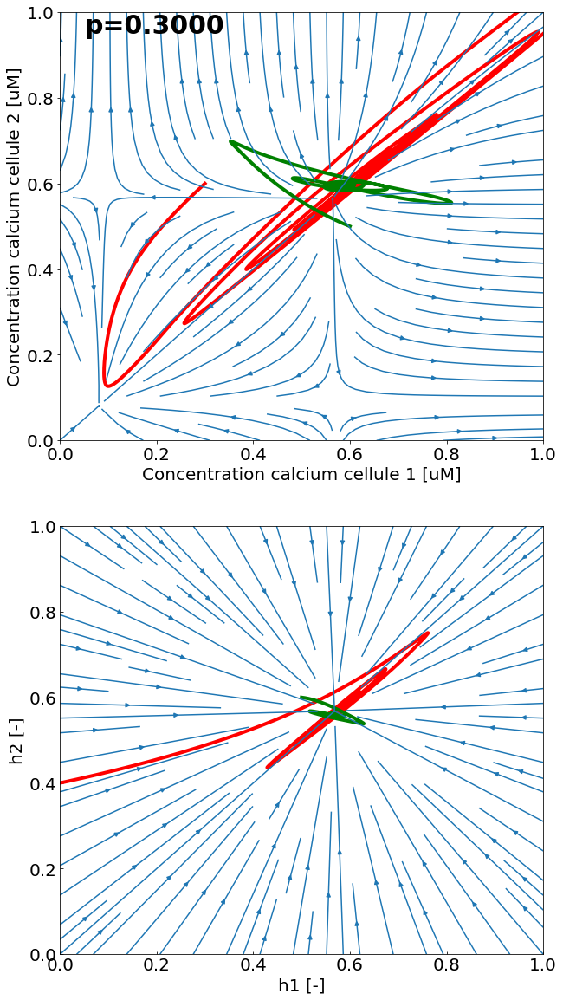

In [10]:
# Résolution problème aux valeurs initiales
initial_conditions1 = [0, 0.3, 0.4, 0.6]  # Conditions initiales [# porte ouverte/fermée, conc Ca] 
initial_conditions2 = [0.5, 0.6, 0.6, 0.5]
t_span = [0, 100]  # Plage de temps

# Limites du portrait de phase
xmax, ymax = 1, 1

# Meshgrid
conc1, conc2 = np.meshgrid(np.linspace(0,xmax,400), np.linspace(0,ymax,400))
h1, h2 = np.meshgrid(np.linspace(0,xmax,400), np.linspace(0,ymax,400))

# Figures pour différentes valeurs de p
D = 0.07
for p in [0.1, 0.2, 0.25, 0.2767, 0.3]: # np.linspace(0.23,0.29,10):

    # Équations différentielles
    dc_dt1, dh_dt1 = two_cells_conc(p, h1, conc1, conc2, D)[0], InsP3(p, h1, conc1)[0]
    dc_dt2, dh_dt2 = two_cells_conc(p, h2, conc2, conc1, D)[0], InsP3(p, h2, conc2)[0]

    # Trajectoire 1
    sol = solve_ivp(system_two_cell, t_span, initial_conditions1, dense_output=True, args=[p])
    h1_fixes, conc1_fixes, h2_fixes, conc2_fixes = points_fixes_two_cell(sol, p)
    temps, h1_val, conc1_val, h2_val, conc2_val = points_two_cell(sol)

    # Trajectoire 2
    sol2 = solve_ivp(system_two_cell, t_span, initial_conditions2, dense_output=True, args=[p])
    h1_fixes2, conc1_fixes2, h2_fixes2, conc2_fixes2 = points_fixes_two_cell(sol2, p)
    temps2, h1_val2, conc1_val2, h2_val2, conc2_val2 = points_two_cell(sol2)

    print("Points fixes trouvés, graph1 :")
    fig, (ax1, ax2) = plt.subplots(2, figsize=(10,20))
    for conc1_fix, conc2_fix in zip(conc1_fixes, conc2_fixes):
        print(f"conc1 = {conc1_fix}, conc2 = {conc2_fix}")
        ax1.scatter(conc1_fix, conc2_fix, color="red", s=100)
    print("Points fixes trouvés, graph2 :")
    for h1_fix, h2_fix in zip(h1_fixes, h2_fixes):
        print(f"h1 = {h1_fix}, h2 = {h2_fix}")
        ax2.scatter(h1_fix, h2_fix, color="red", s=100)

    # Portrait de phase
    ax1.set_xlabel('Concentration calcium cellule 1 [uM]')
    ax1.set_ylabel('Concentration calcium cellule 2 [uM]')
    ax1.set_xlim(0,xmax)
    ax1.set_ylim(0,ymax)
    ax2.set_xlim(0,xmax)
    ax2.set_ylim(0,ymax)
    ax1.plot(conc1_val, conc2_val, color="red", lw=4)
    ax1.plot(conc1_val2, conc2_val2, color="green", lw=4)
    ax1.streamplot(conc1,conc2,dc_dt1,dc_dt2)
    plt.tick_params(direction="in")
    ax1.text(0.05, 0.95, f"p={p:.4f}", fontweight='bold', fontsize=30)
    ax2.set_xlabel('h1 [-]')
    ax2.set_ylabel('h2 [-]')
    ax2.plot(h1_val, h2_val, color="red", lw=4)
    ax2.plot(h1_val2, h2_val2, color="green", lw=4)
    ax2.streamplot(h1,h2,dh_dt1,dh_dt2)
    plt.show()

## Trois cellules
### Fonctions

In [4]:
# Fonctions pour deux cellules
def diff_three_cells(D12, D13, conc1, conc2, conc3):
    """
        Calcul du taux de calcium étant pompé diffusé entre les deux .
    Args :
        D : Constante de proportionnalité, si 0 --> cellules sans interaction
        Conc1 : Concentration de calcium dans la cellule 1
        Conc2 : Concentration de calcium dans la cellule 2
    Returns :
        0 : Fonction
        1 : Dérivée p/r conc1
        2 : Dérivée p/r conc2
        3 : Dérivée p/r conc3
    """
    fonc =  D12*(conc2-conc1) + D13*(conc3-conc1)
    d_dc1 = -D12 - D13
    d_dc2 = D12
    d_dc3 = D13
    return fonc, d_dc1, d_dc2, d_dc3

def three_cells_conc(p, h, conc1, conc2, conc3, D12, D13):
    """
        Équation différentielle d'ordre 1 décrivant la variation de concentration du calcium dans une seule cellule.
    Args :
        p : Concentration d'InsP3
        h : Fraction des récepteurs ouverts ou fermés 
        Conc1 : Concentration de calcium dans la cellule 1
        Conc2 : Concentration de calcium dans la cellule 2
        Conc3 : Concentration de calcium dans la cellule 3
        D : Constante de proportionnalité, si 0 --> cellules sans interaction
    Returns :
        0 : Fonction
        1 : Dérivée p/r conc1
        2 : Dérivée p/r h
        3 : Dérivée p/r conc2
    """
    fonc = recept(p, h, conc1)[0] - pump(conc1)[0] + leak + diff_three_cells(D12, D13, conc1, conc2, conc3)[0]
    d_dc1 = recept(p, h, conc1)[1] - pump(conc1)[1] + diff_three_cells(D12, D13, conc1, conc2, conc3)[1]
    d_dh = recept(p, h, conc1)[2]
    d_dc2 = diff_three_cells(D12, D13, conc1, conc2, conc3)[2]
    d_dc3 = diff_three_cells(D12, D13, conc1, conc2, conc3)[3]
    return fonc, d_dc1, d_dh, d_dc2, d_dc3

def system_three_cell(t, y, p):
    """
        Système EDO d'ordre 1 décrivant la variation de concentration du calcium dans une seule cellule.
    Args :
        t : temps
        y : tuple (h1, concentration1, h2, concentration2, h3, concentration3)
        p : Concentration d'InsP3
    Returns :
        0 : Système
    """
    h1, conc1, h2, conc2, h3, conc3 = y
    dc_dt1 = three_cells_conc(p, h1, conc1, conc2, conc3, D12, D13)[0]
    dh_dt1 = InsP3(p, h1, conc1)[0]
    dc_dt2 = three_cells_conc(p, h2, conc2, conc1, conc3, D12, D13)[0]
    dh_dt2 = InsP3(p, h2, conc2)[0]
    dc_dt3 = three_cells_conc(p, h3, conc3, conc2, conc1, D12, D13)[0]
    dh_dt3 = InsP3(p, h3, conc3)[0]
    return [dh_dt1, dc_dt1, dh_dt2, dc_dt2, dh_dt3, dc_dt3]

def points_fixes_three_cell(sol, p):
    '''
        Calcul des points fixes.
    Args : 
        Sol : Solution du système d'EDO.
        p : Concentration d'InsP3.
    Returns :
        Points fixes.
    '''
    t_values = np.linspace(*t_span, 100000)
    x1_values, y1_values, x2_values, y2_values, x3_values, y3_values = sol.sol(t_values)
    dx_dt1_values, dy_dt1_values, dx_dt2_values, dy_dt2_values, dx_dt3_values, dy_dt3_values = system_three_cell(t_values,
                                                                                            [x1_values, y1_values, x2_values, y2_values, x3_values, y3_values], p)
    indices_points_fixes = np.where((np.abs(dx_dt1_values) < 1e-11) & (np.abs(dy_dt1_values) < 1e-11) & (np.abs(dx_dt2_values) < 1e-11) &
                                    (np.abs(dy_dt2_values) < 1e-11) & (np.abs(dx_dt3_values) < 1e-11) & (np.abs(dy_dt3_values) < 1e-11))
    return (x1_values[indices_points_fixes], y1_values[indices_points_fixes], x2_values[indices_points_fixes],
             y2_values[indices_points_fixes], x3_values[indices_points_fixes], y3_values[indices_points_fixes])

def points_three_cell(sol):
    '''
        Calcul des points.
    Args : 
        Sol : Solution du système d'EDO.
        p : Concentration d'InsP3.
    Returns :
        Points (temps, h1, conc1, h2, conc2)
    '''
    t_values = np.linspace(*t_span, 100000)
    x1_values, y1_values, x2_values, y2_values, x3_values, y3_values = sol.sol(t_values)
    # dx_dt1_values, dy_dt1_values, dx_dt2_values, dy_dt2_values = system_two_cell(t_values, [x1_values, y1_values, x2_values, y2_values], p)
    return t_values, x1_values, y1_values, x2_values, y2_values, x3_values, y3_values

### Trois cellules en triangle

Si on veut 3 cellules en ligne, il faut mettre deux concentration à 0 pour les cellules aux extrémités de la ligne.

In [5]:
# Résolution problème aux valeurs initiales
initial_conditions1 = [0.6, 0.5, 0.8, 0.2, 0.3, 0.8]  # Conditions initiales [# porte ouverte/fermée, conc Ca] 
initial_conditions2 = [0.2, 0.8, 0.3, 0.3, 0.7, 0.3]
t_span = [0, 10000]  # Plage de temps

# Limites du portrait de phase
xmax, ymax = 1.2, 1.2

# Meshgrid
h1, conc1 = np.meshgrid(np.linspace(0,xmax,400), np.linspace(0,ymax,400))
h2, conc2 = np.meshgrid(np.linspace(0,xmax,400), np.linspace(0,ymax,400))
h3, conc3 = np.meshgrid(np.linspace(0,xmax,400), np.linspace(0,ymax,400))

# Figures pour différentes valeurs de p
D12 = 0.01
D13 = 0.01
D23 = 0.01
for p in [0.2333, 0.27, 0.2733, 0.2778, 0.3] : # np.linspace(0.2,0.3,10)

    # Équations différentielles
    dc_dt1, dh_dt1 = three_cells_conc(p, h1, conc1, conc2, conc3, D12, D13)[0], InsP3(p, h1, conc1)[0]
    dc_dt2, dh_dt2 = three_cells_conc(p, h2, conc2, conc1, conc3, D12, D23)[0], InsP3(p, h2, conc2)[0]
    dc_dt3, dh_dt3 = three_cells_conc(p, h3, conc3, conc1, conc2, D13, D23)[0], InsP3(p, h3, conc3)[0]

    # Trajectoire 1
    sol = solve_ivp(system_three_cell, t_span, initial_conditions1, dense_output=True, args=[p], method="Radau")
    h1_fixes, conc1_fixes, h2_fixes, conc2_fixes, h3_fixes, conc3_fixes = points_fixes_three_cell(sol, p)
    temps, h1_val, conc1_val, h2_val, conc2_val, h3_val, conc3_val = points_three_cell(sol)

    # Trajectoire 2
    sol2 = solve_ivp(system_three_cell, t_span, initial_conditions2, dense_output=True, args=[p], method="Radau")
    h1_fixes2, conc1_fixes2, h2_fixes2, conc2_fixes2, h3_fixes2, conc3_fixes2 = points_fixes_three_cell(sol2, p)
    temps2, h1_val2, conc1_val2, h2_val2, conc2_val2, h3_val2, conc3_val2 = points_three_cell(sol2)

    print("Points fixes trouvés, graph1 :")
    fig, ([ax1, ax2], [ax3, ax4]) = plt.subplots(2, 2, figsize=(20,20))
    for h1_fix, conc1_fix in zip(h1_fixes, conc1_fixes):
        print(f"h1 = {h1_fix}, conc1 = {conc1_fix}")
        ax1.scatter(h1_fix, conc1_fix, color="red", s=100)
    print("Points fixes trouvés, graph2 :")
    for h2_fix, conc2_fix in zip(h2_fixes, conc2_fixes):
        print(f"h2 = {h2_fix}, conc2 = {conc2_fix}")
        ax2.scatter(h2_fix, conc2_fix, color="red", s=100)
    print("Points fixes trouvés, graph3 :")
    for h3_fix, conc3_fix in zip(h3_fixes, conc3_fixes):
        print(f"h3 = {h3_fix}, conc3 = {conc3_fix}")
        ax3.scatter(h3_fix, conc3_fix, color="red", s=100)

    # Stabilité
    if len(h1_fixes) != 0 & len(h2_fixes) !=0 & len(h3_fixes) != 0:
        jac = np.array([[three_cells_conc(p, h1_fixes[-1], conc1_fixes[-1], conc2_fixes[-1], conc3_fixes[-1], D12, D13)[1], 
                        three_cells_conc(p, h1_fixes[-1], conc1_fixes[-1], conc2_fixes[-1], conc3_fixes[-1], D12, D13)[2]],
                    [InsP3(p, h1_fixes[-1], conc1_fixes[-1])[1], InsP3(p, h1_fixes[-1], conc1_fixes[-1])[2]]])
    else :
        jac = np.array([[three_cells_conc(p, h1_val[-1], conc1_val[-1], conc2_val[-1], conc3_val[-1], D12, D13)[1], 
                        three_cells_conc(p, h1_val[-1], conc1_val[-1], conc2_val[-1], conc3_val[-1], D12, D13)[2]],
                    [InsP3(p, h1_val[-1], conc1_val[-1])[1], InsP3(p, h1_val[-1], conc1_val[-1])[2]]])
    det = np.linalg.det(jac)
    tau = np.trace(jac)
    print(f"Delta = {det}\ntau = {tau}")

    # Portrait de phase
    ax1.set_xlabel('h1 [-]')
    ax1.set_ylabel(r'Concentration de calcium ionisé de la cellule 1 [$\mu$M]')
    ax1.set_xlim(0,xmax)
    ax1.set_ylim(0,ymax)
    ax2.set_xlim(0,xmax)
    ax2.set_ylim(0,ymax)
    ax3.set_xlim(0,xmax)
    ax3.set_ylim(0,ymax)
    ax1.streamplot(h1,conc1,dh_dt1,dc_dt1, broken_streamlines=False, color="gray")
    ax1.plot(h1_val, conc1_val, color="black", lw=2)
    ax1.plot(h1_val2, conc1_val2, color="red", lw=2)
    plt.tick_params(direction="in")
    ax1.text(0, 0.95, f"p={p:.4f}", fontweight='bold', fontsize=30)
    ax2.set_xlabel('h2 [-]')
    ax2.set_ylabel(r'Concentration de calcium ionisé de la cellule 2 [$\mu$M]')
    ax2.streamplot(h2,conc2,dh_dt2,dc_dt2, broken_streamlines=False, color="gray")
    ax2.plot(h2_val, conc2_val, color="black", lw=2)
    ax2.plot(h2_val2, conc2_val2, color="red", lw=2)
    ax3.set_xlabel('h3 [-]')
    ax3.set_ylabel(r'Concentration de calcium ionisé de la cellule 3 [$\mu$M]')
    ax3.streamplot(h3,conc3,dh_dt3,dc_dt3, broken_streamlines=False, color="gray")
    ax3.plot(h3_val, conc3_val, color="black", lw=2)
    ax3.plot(h3_val2, conc3_val2, color="red", lw=2)
    ax1.text(-0.12, 0.93, f"(a)", fontweight='bold', fontsize=30)
    ax2.text(0, 1.12, f"(b)", fontweight='bold', fontsize=30)
    ax3.text(0, 1.12, f"(c)", fontweight='bold', fontsize=30)
    ax4.text(0, 1.32, f"(d)", fontweight='bold', fontsize=30)

    # Concentration en fonction du temps
    ax4.set_xlabel('Temps [s]')
    ax4.set_ylabel(r'Concentration de calcium ionisé [\mu M]')
    ax4.plot(temps, conc1_val, label=r"$c_1$, scénario 1", linestyle=":", color="black", lw=2)
    ax4.plot(temps2, conc1_val2, label=r"$c_1$, scénario 2", linestyle=":", color="red", lw=2)
    ax4.set_xlim(0,20)
    ax4.set_ylim(0,1.4)
    plt.tick_params(direction="in")
    ax4.plot(temps, conc2_val, label=r"$c_2$, scénario 1", linestyle="--", color="black", lw=2)
    ax4.plot(temps2, conc2_val2, label=r"$c_2$, scénario 2", linestyle="--", color="red", lw=2)
    ax4.plot(temps, conc3_val, label=r"$c_3$, scénario 1", color="black", lw=2)
    ax4.plot(temps2, conc3_val2, label=r"$c_3$, scénario 2", color="red", lw=2)
    ax4.legend(loc="upper right")
    Amplitude11 = (max(conc1_val[2000:]) - min(conc1_val[2000:]))/2
    Moyenne11 = (max(conc1_val[2000:]) + min(conc1_val[2000:]))/2
    Amplitude12 = (max(conc1_val2[2000:]) - min(conc1_val2[2000:]))/2
    Moyenne12 = (max(conc1_val2[2000:]) + min(conc1_val2[2000:]))/2
    Amplitude21 = (max(conc2_val[2000:]) - min(conc2_val[2000:]))/2
    Moyenne21 = (max(conc2_val[2000:]) + min(conc2_val[2000:]))/2
    Amplitude22 = (max(conc2_val2[2000:]) - min(conc2_val2[2000:]))/2
    Moyenne22 = (max(conc2_val2[2000:]) + min(conc2_val2[2000:]))/2
    Amplitude31 = (max(conc3_val[2000:]) - min(conc3_val[2000:]))/2
    Moyenne31 = (max(conc3_val[2000:]) + min(conc3_val[2000:]))/2
    Amplitude32 = (max(conc3_val2[2000:]) - min(conc3_val2[2000:]))/2
    Moyenne32 = (max(conc3_val2[2000:]) + min(conc3_val2[2000:]))/2
    print(f"Amplitude cell1 = {Amplitude11} et {Amplitude12}")
    print(f"Moyenne cell1 = {Moyenne11} et {Moyenne12}")
    print(f"Amplitude cell2  = {Amplitude21} et {Amplitude22}")
    print(f"Moyenne cell3 = {Moyenne21} et {Moyenne22}")
    print(f"Amplitude = {Amplitude31} et {Amplitude32}")
    print(f"Moyenne = {Moyenne31} et {Moyenne32}")
    plt.savefig(pwd + f"Trois cellules, D=0.01, p={p}.pdf", format="pdf")
    plt.show()

Points fixes trouvés, graph1 :
h1 = 0.8173968929513143, conc1 = 0.12791921079051552
h1 = 0.8173968929038383, conc1 = 0.12791921084847846
h1 = 0.817396892856801, conc1 = 0.12791921090587513
h1 = 0.8173968928102009, conc1 = 0.1279192109627075
h1 = 0.8173968927640366, conc1 = 0.12791921101897752
h1 = 0.8173968927183067, conc1 = 0.1279192110746871
h1 = 0.8173968926730096, conc1 = 0.1279192111298382
h1 = 0.817396892628144, conc1 = 0.12791921118443278
h1 = 0.8173968925837083, conc1 = 0.1279192112384728
h1 = 0.8173968920894437, conc1 = 0.12791921115906668
h1 = 0.8173968921078705, conc1 = 0.12791921113477686
h1 = 0.8173968921262795, conc1 = 0.12791921111052798
h1 = 0.8173968921446695, conc1 = 0.12791921108632198
h1 = 0.8173968921630387, conc1 = 0.1279192110621608
h1 = 0.8173968921813858, conc1 = 0.12791921103804643
h1 = 0.8173968921997093, conc1 = 0.12791921101398077
h1 = 0.8173968922180078, conc1 = 0.1279192109899658
h1 = 0.8173968922362798, conc1 = 0.12791921096600345
h1 = 0.8173968922545237

KeyboardInterrupt: 

## Deux cellules différentes
### Fonctions

In [13]:
# Fonctions combinées
def recept_2(p, h, conc, kf):
    """
        Calcul du taux de calcium qui entre dans la cellule par un récepteur InsP3 du réticulum endoplasmique.
    Args :
        p : Concentration d'InsP3
        h : Fraction des récepteurs ouverts ou fermés
        Conc : Concentration de calcium
    Returns :
        0 : Fonction
        1 : Dérivée p/r conc
        2 : Dérivée p/r h
    """
    paren = (p*h*phi_1(conc)[0]) / (phi_1(conc)[0]*p + phi_m1(conc)[0])
    fonc = kf * paren**4
    d_dc = 4 * kf * paren**3 * ((p*h * (phi_m1(conc)[0]*phi_1(conc)[1] - phi_1(conc)[0]*phi_m1(conc)[1])) / (phi_1(conc)[0]*p + phi_m1(conc)[0])**2)
    d_dh = 4 * kf * paren**3 * (p*phi_1(conc)[0]) / (phi_1(conc)[0]*p + phi_m1(conc)[0])
    return fonc, d_dc, d_dh

# Nouvelles fonctions pour deux cellules
def two_cells_conc_2(p, h, conc1, conc2, D, kf):
    """
        Équation différentielle d'ordre 1 décrivant la variation de concentration du calcium dans une seule cellule.
    Args :
        p : Concentration d'InsP3
        h : Fraction des récepteurs ouverts ou fermés 
        Conc1 : Concentration de calcium dans la cellule 1
        Conc2 : Concentration de calcium dans la cellule 2
        D : Constante de proportionnalité, si 0 --> cellules sans interaction
    Returns :
        0 : Fonction
        1 : Dérivée p/r conc1
        2 : Dérivée p/r h
        3 : Dérivée p/r conc2
    """
    fonc = recept_2(p, h, conc1, kf)[0] - pump(conc1)[0] + leak + diff_two_cells(D, conc1, conc2)[0]
    d_dc1 = recept_2(p, h, conc1, kf)[1] - pump(conc1)[1] + diff_two_cells(D, conc1, conc2)[1]
    d_dh = recept_2(p, h, conc1, kf)[2]
    d_dc2 = diff_two_cells(D, conc1, conc2)[2]
    return fonc, d_dc1, d_dh, d_dc2

def system_two_cell_2(t, y, p, kf1, kf2):
    """
        Système EDO d'ordre 1 décrivant la variation de concentration du calcium dans une seule cellule.
    Args :
        t : temps
        y : tuple (h1, concentration1, h2, concentration2)
        p : Concentration d'InsP3
    Returns :
        0 : Système
    """
    h1, conc1, h2, conc2 = y
    dc_dt1 = two_cells_conc_2(p, h1, conc1, conc2, D, kf1)[0]
    dh_dt1 = InsP3(p, h1, conc1)[0]
    dc_dt2 = two_cells_conc_2(p, h2, conc2, conc1, D, kf2)[0]
    dh_dt2 = InsP3(p, h2, conc2)[0]
    return [dh_dt1, dc_dt1, dh_dt2, dc_dt2]

def points_fixes_two_cell_2(sol, p, kf1, kf2):
    '''
        Calcul des points fixes.
    Args : 
        Sol : Solution du système d'EDO.
        p : Concentration d'InsP3.
    Returns :
        Points fixes.
    '''
    t_values = np.linspace(*t_span, 1000)
    x1_values, y1_values, x2_values, y2_values = sol.sol(t_values)
    dx_dt1_values, dy_dt1_values, dx_dt2_values, dy_dt2_values = system_two_cell_2(t_values, [x1_values, y1_values, x2_values, y2_values], p, kf1, kf2)
    indices_points_fixes1 = np.where((np.abs(dx_dt1_values) < 1e-6) & (np.abs(dy_dt1_values) < 1e-6))
    indices_points_fixes2 = np.where((np.abs(dx_dt2_values) < 1e-6) & (np.abs(dy_dt2_values) < 1e-6))
    return x1_values[indices_points_fixes1], y1_values[indices_points_fixes1], x2_values[indices_points_fixes2], y2_values[indices_points_fixes2]

def points_two_cell_2(sol):
    '''
        Calcul des points.
    Args : 
        Sol : Solution du système d'EDO.
        p : Concentration d'InsP3.
    Returns :
        Points (temps, h1, conc1, h2, conc2)
    '''
    t_values = np.linspace(*t_span, 10000)
    x1_values, y1_values, x2_values, y2_values = sol.sol(t_values)
    # dx_dt1_values, dy_dt1_values, dx_dt2_values, dy_dt2_values = system_two_cell(t_values, [x1_values, y1_values, x2_values, y2_values], p)
    return t_values, x1_values, y1_values, x2_values, y2_values

### Main

Points fixes trouvés, graph1 :
x = 0.9270906436020913, y = 0.0820623055534276
x = 0.9270907041466954, y = 0.08206254708890535
x = 0.9270906217343835, y = 0.082062407600558
x = 0.9270906705430493, y = 0.08206249633224581
x = 0.9270908073594233, y = 0.08206276071502565
x = 0.927090829172232, y = 0.08206270297313382
x = 0.927090831261528, y = 0.08206268768482015
x = 0.9270908460130906, y = 0.08206286670041009
x = 0.927090700067415, y = 0.08206242797238252
x = 0.9270906787134029, y = 0.08206233162923482
x = 0.9270907329489768, y = 0.08206258793681397
x = 0.9270907288681123, y = 0.08206258752798841
x = 0.9270907182455591, y = 0.08206258663079545
x = 0.9270907046525684, y = 0.08206255375799054
Points fixes trouvés, graph2 :
x = 0.9271370857060602, y = 0.08200355149552603
x = 0.9271372509864424, y = 0.08200379625060265
Delta = 4.0294697471019205
tau = -4.931135106727071


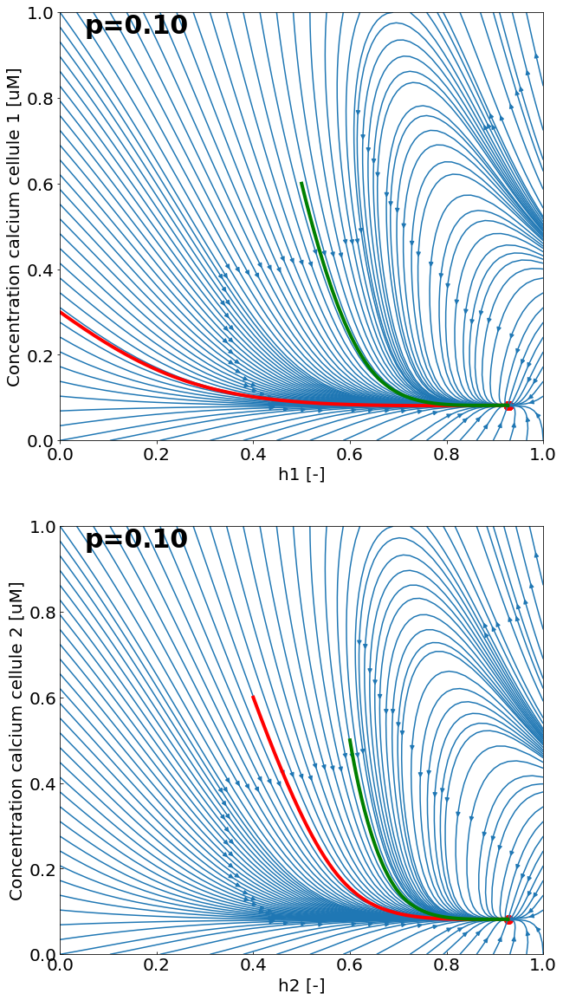

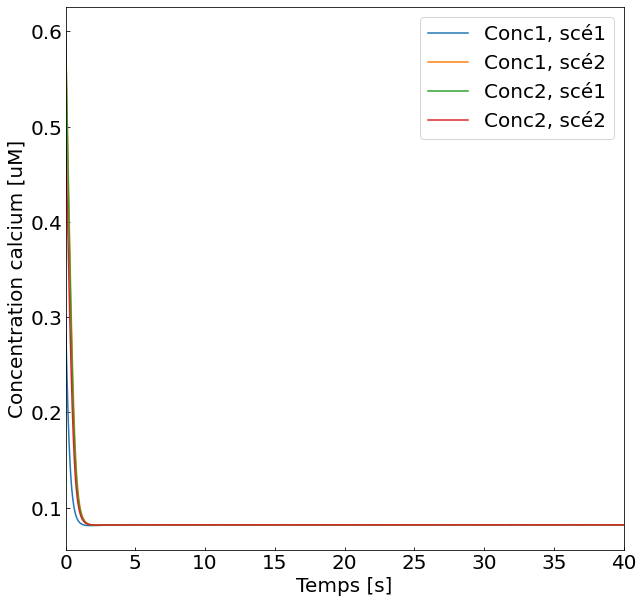

Points fixes trouvés, graph1 :
x = 0.913245796376852, y = 0.08360027519596212
x = 0.9132458260449686, y = 0.08360031751810383
x = 0.9132456358482017, y = 0.08359981084007681
x = 0.9132457374879012, y = 0.08360006740405095
x = 0.9132456727401888, y = 0.08359999226284093
x = 0.9132457781234435, y = 0.08360014830746157
x = 0.9132457632741554, y = 0.08359996211623344
x = 0.9132457751477802, y = 0.08359993895074888
x = 0.9132457264662454, y = 0.08359999998037417
x = 0.9132457199359347, y = 0.08359999343387078
x = 0.9132457779072088, y = 0.08360016794161321
x = 0.9132456529333879, y = 0.0835998040060003
x = 0.91324571323867, y = 0.08359998191721833
x = 0.9132457411950551, y = 0.08360008239922337
x = 0.9132457367154349, y = 0.08360006569651342
x = 0.9132456928411141, y = 0.08359994163027523
x = 0.913245779426857, y = 0.08360019214251606
x = 0.9132457355068945, y = 0.08360006506295396
x = 0.9132457508865647, y = 0.08360012236510053
Points fixes trouvés, graph2 :
x = 0.9133544921569712, y = 0.0

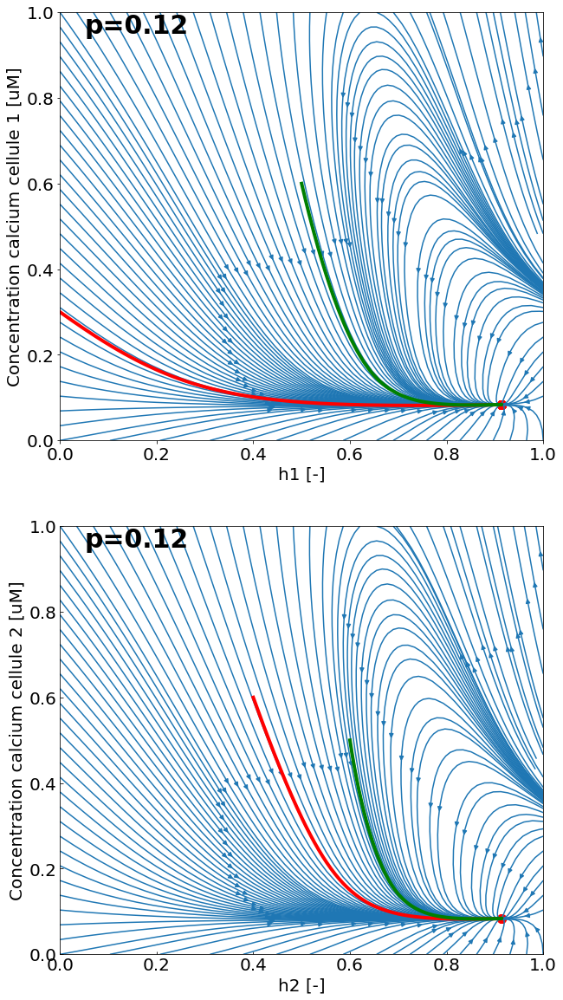

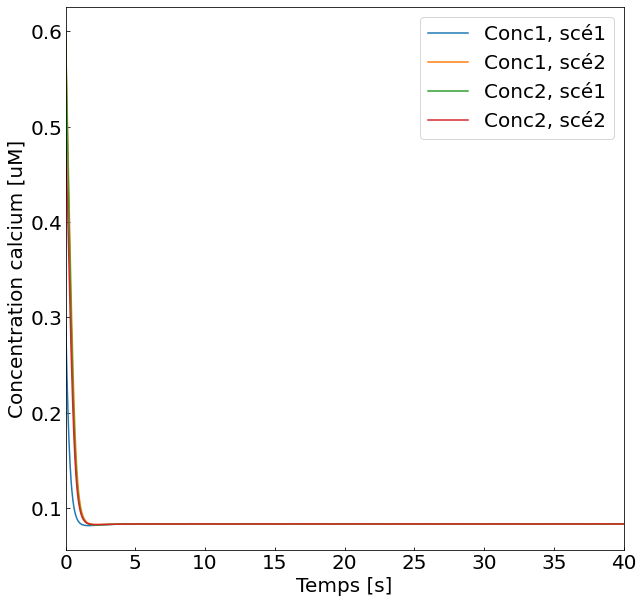

Points fixes trouvés, graph1 :
x = 0.8992963301219451, y = 0.08603580342242854
x = 0.8992963167546035, y = 0.08603594258079837
x = 0.8992961759932594, y = 0.08603564157026229
x = 0.8992962987320469, y = 0.08603580973772741
x = 0.8992964383525869, y = 0.08603586441821402
x = 0.8992964802423422, y = 0.08603576232105493
x = 0.8992963868440662, y = 0.0860357138957273
x = 0.8992964026997833, y = 0.08603590582284945
x = 0.8992962788151498, y = 0.08603557882450474
x = 0.8992962538831233, y = 0.08603556170230639
Points fixes trouvés, graph2 :
Delta = 3.66042233547497
tau = -4.42532576048562


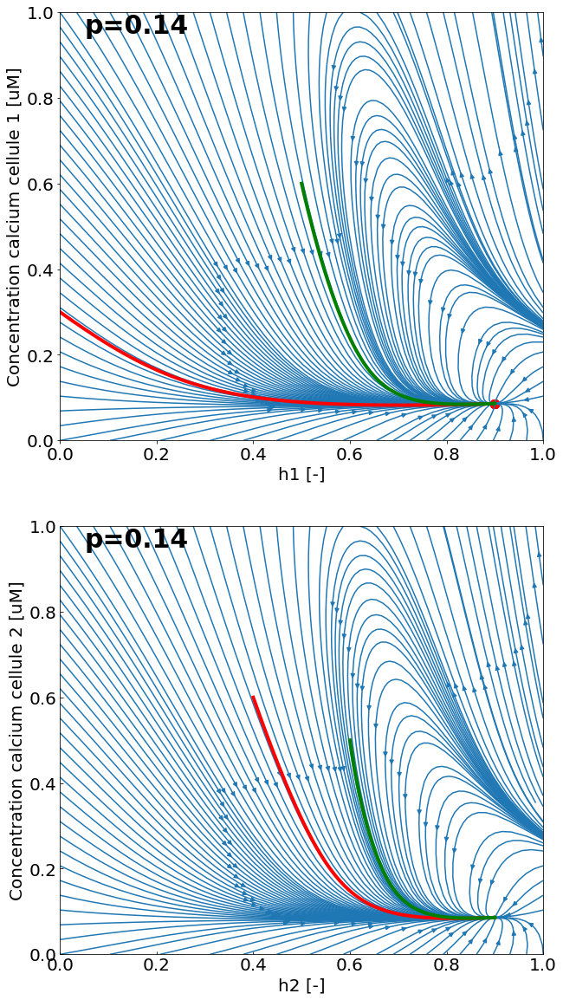

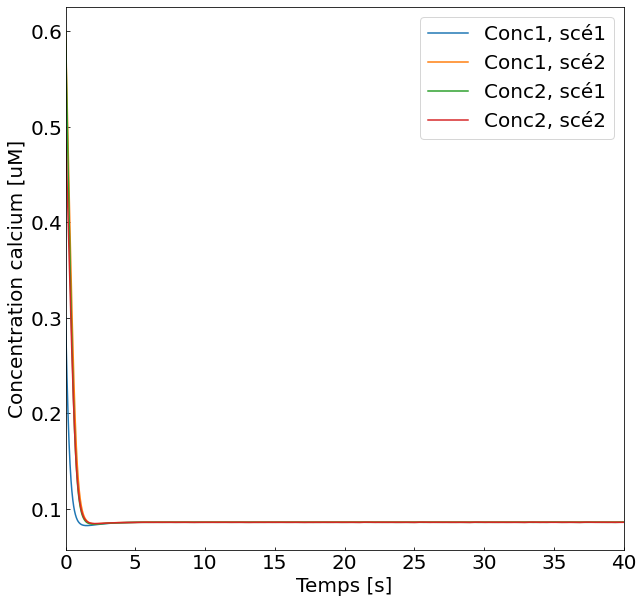

Points fixes trouvés, graph1 :
x = 0.8846150340913719, y = 0.08980516965581234
x = 0.8846149839921503, y = 0.08980492805531459
x = 0.8846148841625658, y = 0.0898049434076829
x = 0.8846149851912533, y = 0.08980502100406981
x = 0.8846146244938922, y = 0.08980461084596993
x = 0.8846146871412562, y = 0.08980464146057497
x = 0.8846150564388241, y = 0.08980499308250507
x = 0.884615167842109, y = 0.08980524364056637
x = 0.884614964698403, y = 0.08980496704991803
x = 0.8846149203981272, y = 0.0898048718254684
x = 0.8846149657364991, y = 0.08980498409912069
x = 0.8846149583675695, y = 0.0898049567078706
x = 0.8846147794234909, y = 0.08980468532232612
x = 0.8846149352435868, y = 0.08980493132257357
x = 0.884615075547736, y = 0.08980519198248867
x = 0.884614804389397, y = 0.08980471278786921
x = 0.8846151381610603, y = 0.08980528470414587
x = 0.8846149875289661, y = 0.08980502314299353
x = 0.8846150780597656, y = 0.08980517507148286
x = 0.8846150892598169, y = 0.08980519574666235
x = 0.8846148762

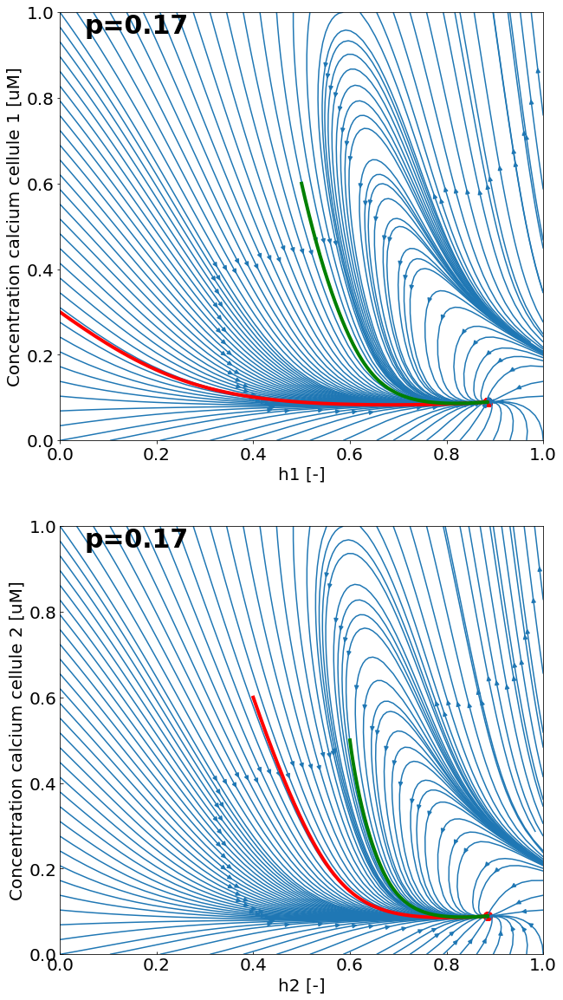

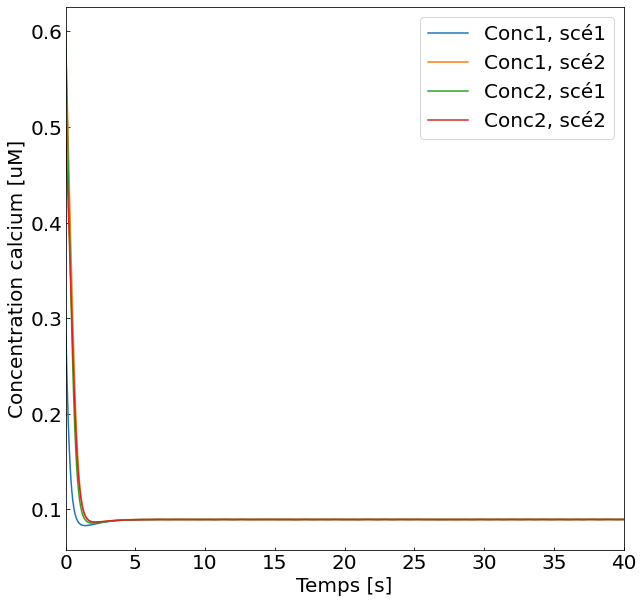

Points fixes trouvés, graph1 :
x = 0.8682086966964878, y = 0.09575105102362219
x = 0.8682083059796946, y = 0.09575066750618882
x = 0.8682082874166507, y = 0.0957504706679108
x = 0.868208277504172, y = 0.09575070371085363
x = 0.868207941390773, y = 0.09575035915551727
x = 0.8682084165346455, y = 0.09575085545011915
x = 0.868208363529265, y = 0.09575078949015525
x = 0.8682080659759334, y = 0.09575052483029098
x = 0.8682083404861098, y = 0.0957507911106522
x = 0.8682082107910758, y = 0.09575066524720892
x = 0.8682082940590434, y = 0.09575075007668735
x = 0.8682082941921493, y = 0.09575074141616528
x = 0.8682083565848183, y = 0.09575081394490725
x = 0.8682082982600954, y = 0.09575077906911403
x = 0.8682079003564046, y = 0.09575038413660464
x = 0.8682081844131192, y = 0.09575065472110676
x = 0.8682083648343244, y = 0.09575082027019478
x = 0.8682078278571519, y = 0.09575036332563565
x = 0.8682082692758532, y = 0.09575073276755415
x = 0.8682082737784488, y = 0.09575074026855894
x = 0.86820834

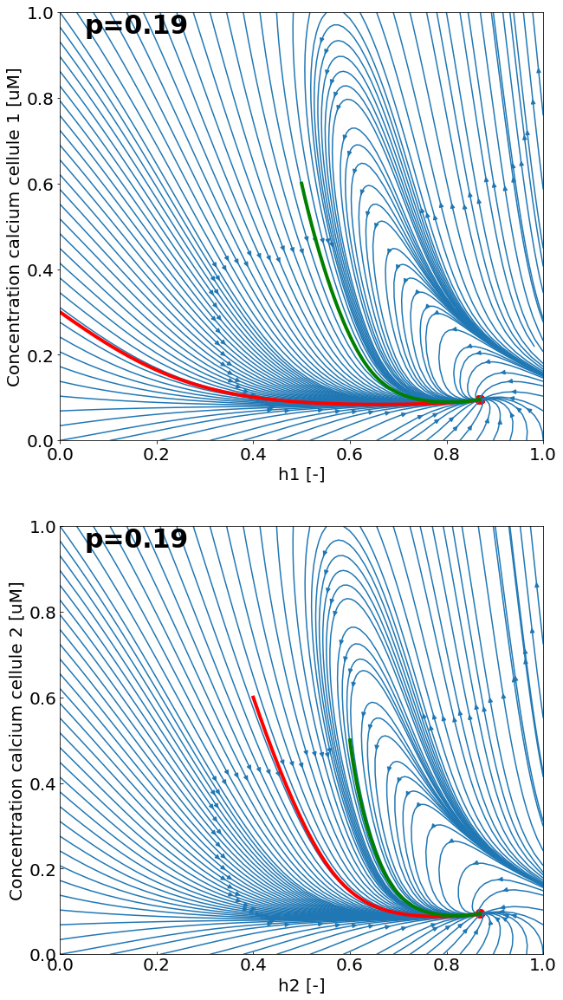

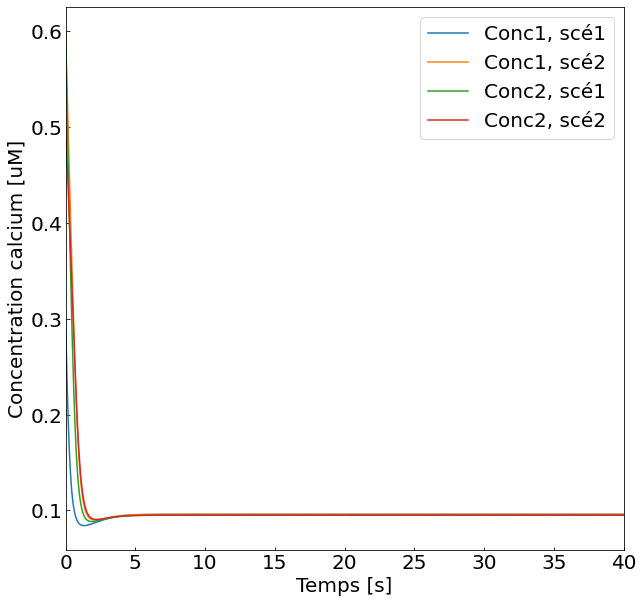

Points fixes trouvés, graph1 :
x = 0.8480347473335546, y = 0.10590222748964304
x = 0.8480348308438375, y = 0.10590228770843639
x = 0.8480349237248155, y = 0.10590235528983867
x = 0.8480350239734498, y = 0.10590242867868298
x = 0.8480351275329588, y = 0.10590250540689759
x = 0.8480352282928187, y = 0.10590258209350607
x = 0.8480353180887628, y = 0.10590265444462715
x = 0.8480353867027814, y = 0.10590271725347485
x = 0.8480354218631231, y = 0.10590276440035835
x = 0.8480354092442931, y = 0.10590278885268214
Points fixes trouvés, graph2 :
Delta = 2.2176995339259213
tau = -2.5944815677464765


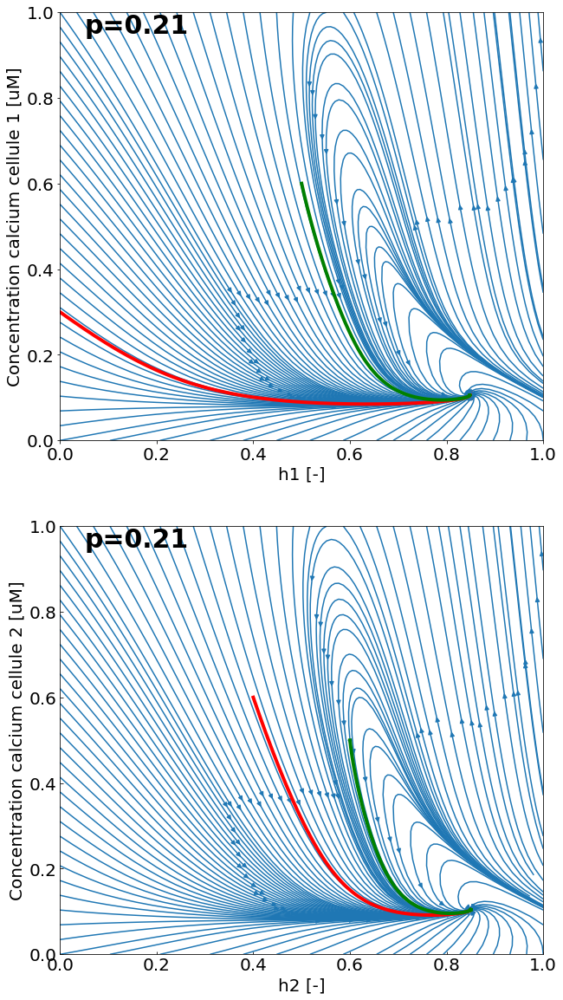

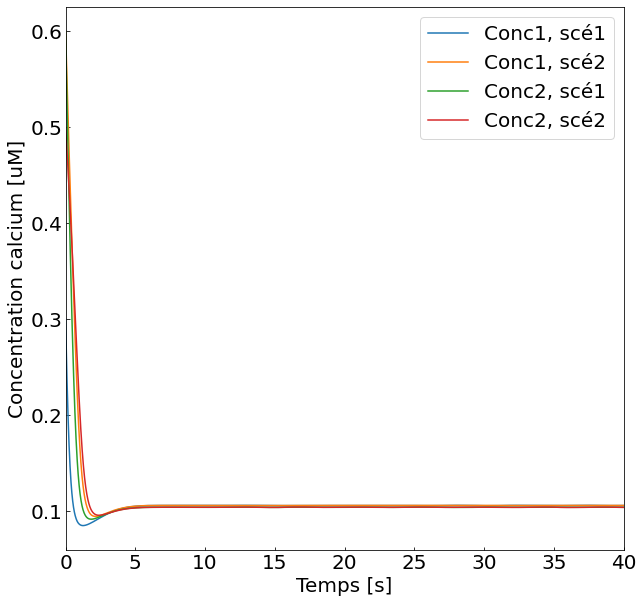

Points fixes trouvés, graph1 :
x = 0.8173796860192839, y = 0.12792390206926207
x = 0.8173793588540376, y = 0.12792385686840801
x = 0.8173790481253056, y = 0.12792435907793523
x = 0.8173793566386803, y = 0.12792420990680273
x = 0.8173792628035458, y = 0.12792379368518503
x = 0.8173791243616131, y = 0.12792323885091503
x = 0.8173799449211916, y = 0.127921865284923
x = 0.8173797695886381, y = 0.12792243706578954
x = 0.8173796125744551, y = 0.12792291032610928
x = 0.8173794897085193, y = 0.1279232695072165
x = 0.8173794135960043, y = 0.1279235040761012
x = 0.8173793936173818, y = 0.1279236085254092
x = 0.8173794359284206, y = 0.127923582373442
x = 0.817379543460187, y = 0.12792343016415691
x = 0.8173797159190452, y = 0.12792316146716698
x = 0.8173799497866565, y = 0.127922790877741
x = 0.8173802383199797, y = 0.12792233801680358
x = 0.8173790527940201, y = 0.12792378622992703
x = 0.8173797209754808, y = 0.1279238480132676
x = 0.8173792417795116, y = 0.12792408924815596
x = 0.81737913623074

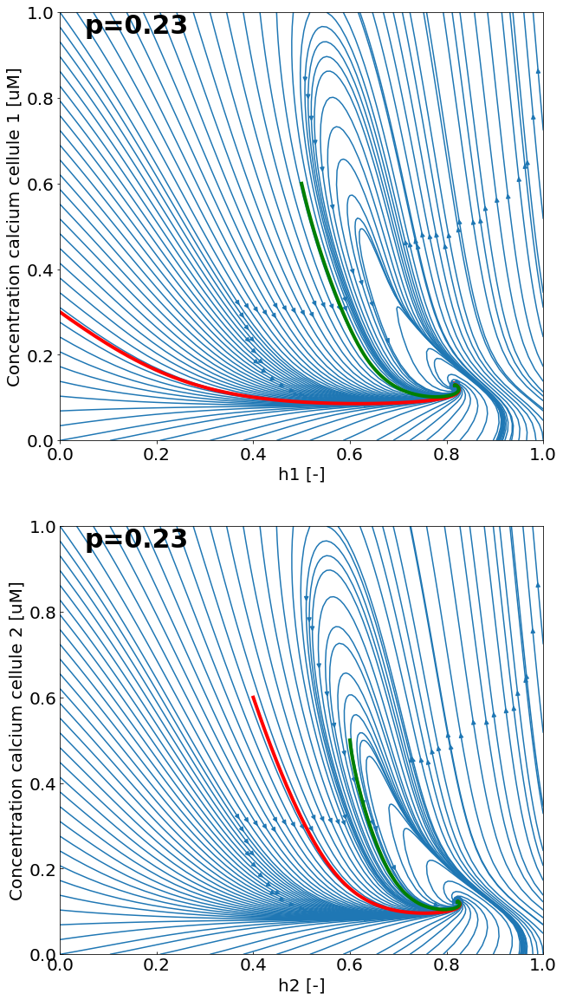

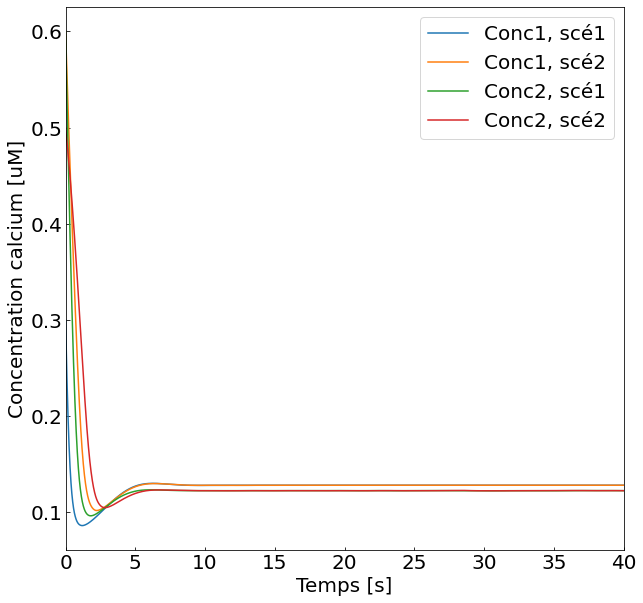

Points fixes trouvés, graph1 :
Points fixes trouvés, graph2 :
Delta = 2.19148668638539
tau = -2.206508105787966


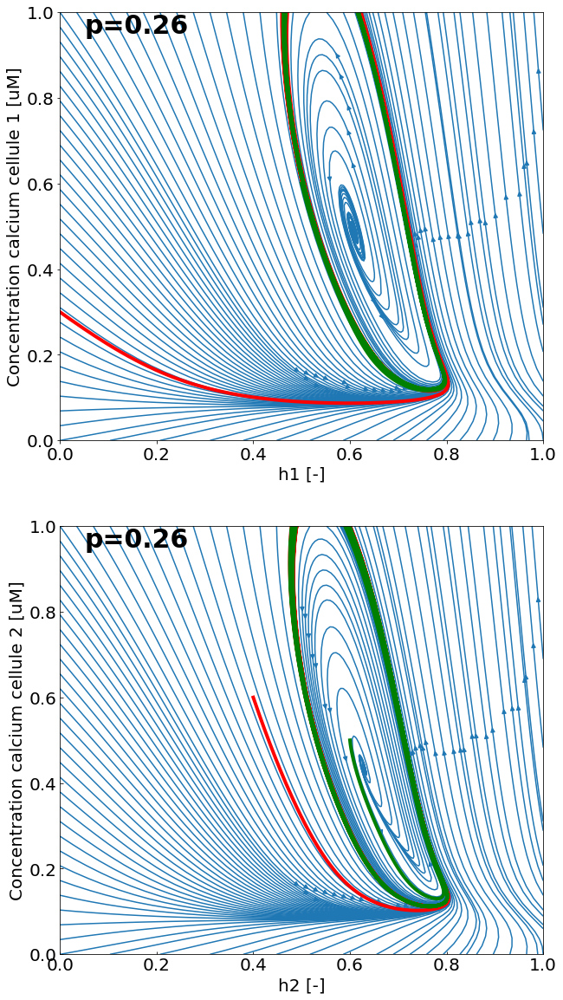

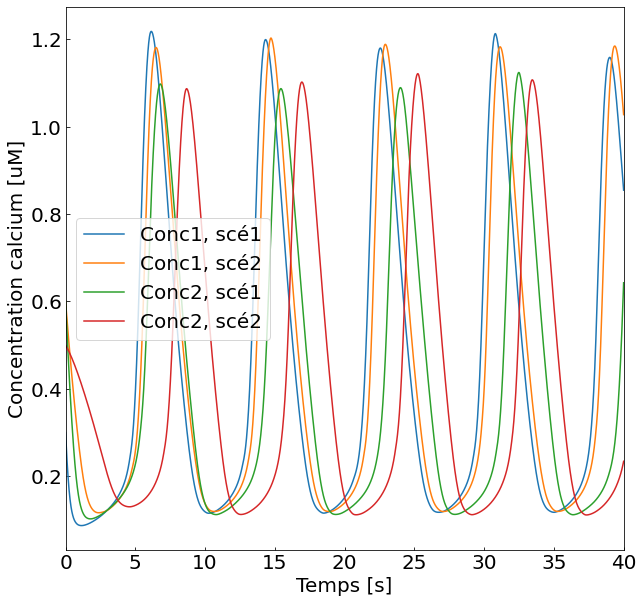

Points fixes trouvés, graph1 :
Points fixes trouvés, graph2 :
Delta = 0.675125615944578
tau = -0.22990138559464324


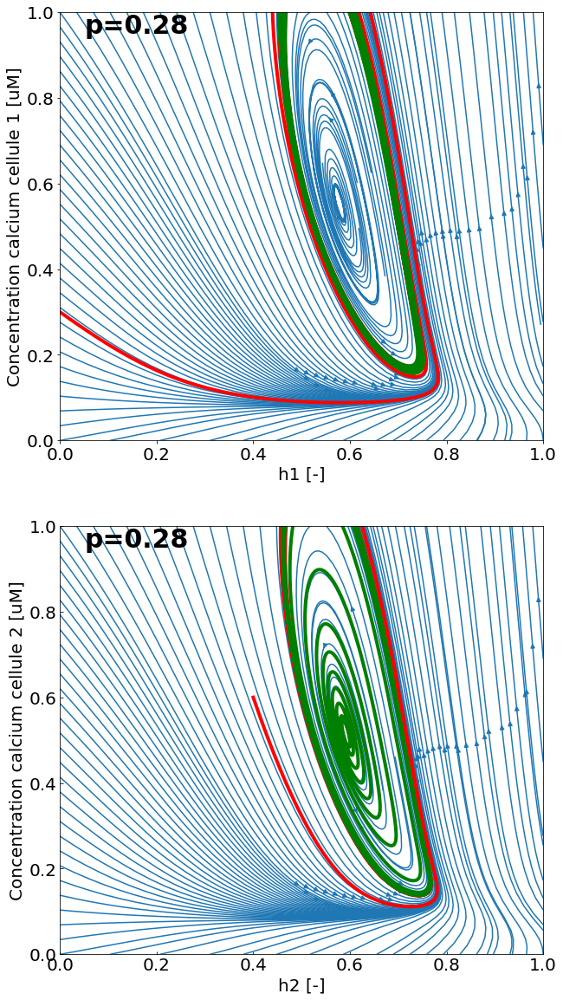

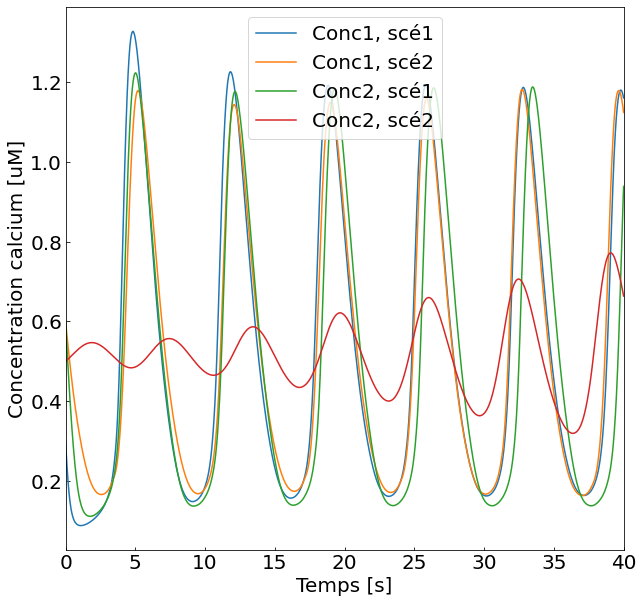

Points fixes trouvés, graph1 :
Points fixes trouvés, graph2 :
Delta = 1.4049405026302275
tau = -0.2698775460991709


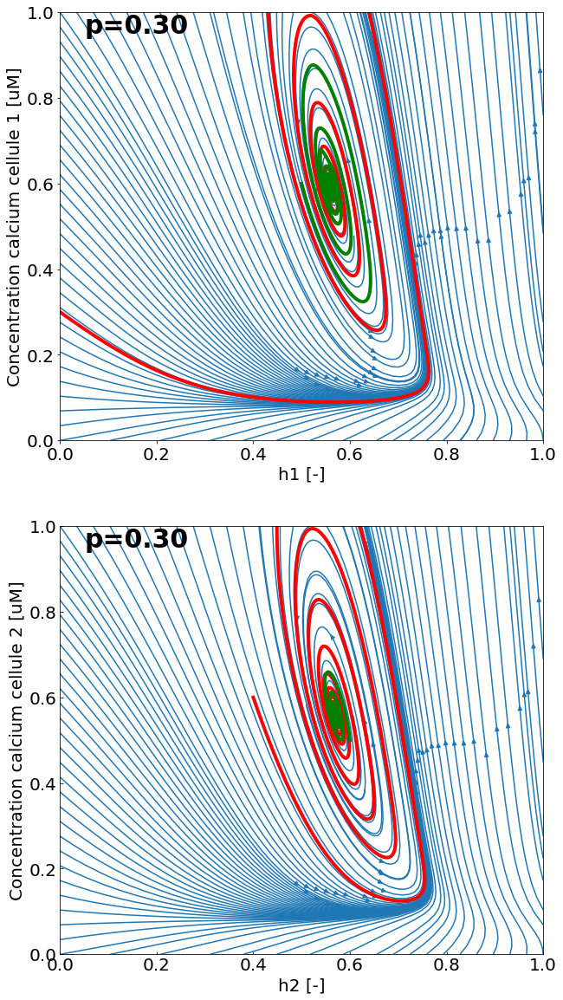

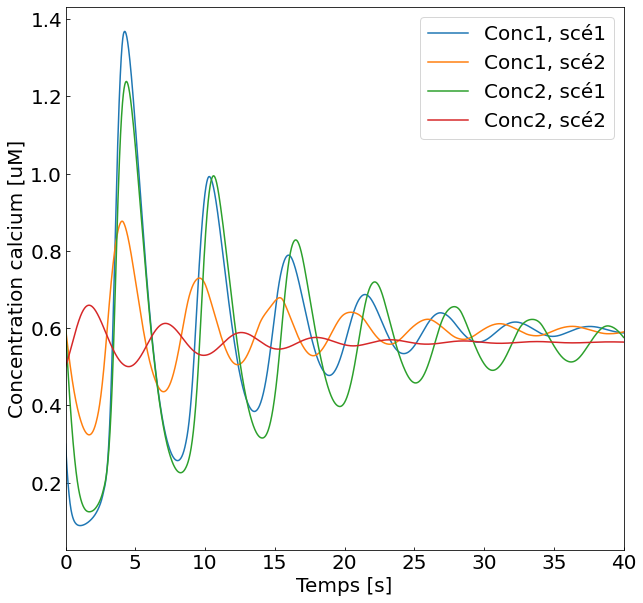

In [14]:
# Résolution problème aux valeurs initiales
initial_conditions1 = [0, 0.3, 0.4, 0.6]  # Conditions initiales [# porte ouverte/fermée, conc Ca] 
initial_conditions2 = [0.5, 0.6, 0.6, 0.5]
t_span = [0, 100]  # Plage de temps
kf1 = 28
kf2 = 27

# Limite du portrait de phase
xmax, ymax = 1, 1

# Meshgrid
h1, conc1 = np.meshgrid(np.linspace(0,xmax,400), np.linspace(0,ymax,400))
h2, conc2 = np.meshgrid(np.linspace(0,xmax,400), np.linspace(0,ymax,400))

# Figures pour différentes valeurs de p
D = 0.01
for p in np.linspace(0.1,0.3,10):
    
    # Équations différentielles
    dc_dt1, dh_dt1 = two_cells_conc_2(p, h1, conc1, conc2, D, kf1)[0], InsP3(p, h1, conc1)[0]
    dc_dt2, dh_dt2 = two_cells_conc_2(p, h2, conc2, conc1, D, kf2)[0], InsP3(p, h2, conc2)[0]

    # Trajectoire 1
    sol = solve_ivp(system_two_cell_2, t_span, initial_conditions1, dense_output=True, args=[p, kf1, kf2])
    h1_fixes, conc1_fixes, h2_fixes, conc2_fixes = points_fixes_two_cell_2(sol, p, kf1, kf2)
    temps, h1_val, conc1_val, h2_val, conc2_val = points_two_cell_2(sol)

    # Trajectoire 2
    sol2 = solve_ivp(system_two_cell_2, t_span, initial_conditions2, dense_output=True, args=[p, kf1, kf2])
    h1_fixes2, conc1_fixes2, h2_fixes2, conc2_fixes2 = points_fixes_two_cell_2(sol2, p, kf1, kf2)
    temps2, h1_val2, conc1_val2, h2_val2, conc2_val2 = points_two_cell_2(sol2)

    print("Points fixes trouvés, graph1 :")
    fig, (ax1, ax2) = plt.subplots(2, figsize=(10,20))
    for h1_fix, conc1_fix in zip(h1_fixes, conc1_fixes):
        print(f"x = {h1_fix}, y = {conc1_fix}")
        ax1.scatter(h1_fix, conc1_fix, color="red", s=100)
    print("Points fixes trouvés, graph2 :")
    for h2_fix, conc2_fix in zip(h2_fixes, conc2_fixes):
        print(f"x = {h2_fix}, y = {conc2_fix}")
        ax2.scatter(h2_fix, conc2_fix, color="red", s=100)

    # Stabilité
    if len(h1_fixes) != 0 & len(h1_fixes2) !=0 :
        jac = np.array([[two_cells_conc_2(p, h1_fixes[-1], conc1_fixes[-1], conc2_fixes[-1], D, kf1)[1], two_cells_conc_2(p, h1_fixes[-1], conc1_fixes[-1], conc2_fixes[-1], D, kf1)[2]],
                    [InsP3(p, h1_fixes[-1], conc1_fixes[-1])[1], InsP3(p, h1_fixes[-1], conc1_fixes[-1])[2]]])
    else :
        jac = np.array([[two_cells_conc_2(p, h1_val[-1], conc1_val[-1], conc2_val[-1], D, kf1)[1], two_cells_conc_2(p, h1_val[-1], conc1_val[-1], conc2_val[-1], D, kf1)[2]],
                    [InsP3(p, h1_val[-1], conc1_val[-1])[1], InsP3(p, h1_val[-1], conc1_val[-1])[2]]])
    det = np.linalg.det(jac)
    tau = np.trace(jac)
    print(f"Delta = {det}\ntau = {tau}")

    # Portrait de phase
    ax1.set_xlabel('h1 [-]')
    ax1.set_ylabel('Concentration calcium cellule 1 [uM]')
    ax1.set_xlim(0,xmax)
    ax1.set_ylim(0,ymax)
    ax2.set_xlim(0,xmax)
    ax2.set_ylim(0,ymax)
    ax1.streamplot(h1,conc1,dh_dt1,dc_dt1, broken_streamlines=False)
    ax1.plot(h1_val, conc1_val, color="red", lw=4)
    ax1.plot(h1_val2, conc1_val2, color="green", lw=4)
    plt.tick_params(direction="in")
    ax1.text(0.05, 0.95, f"p={p:.2f}", fontweight='bold', fontsize=30)
    ax2.text(0.05, 0.95, f"p={p:.2f}", fontweight='bold', fontsize=30)
    ax2.set_xlabel('h2 [-]')
    ax2.set_ylabel('Concentration calcium cellule 2 [uM]')
    ax2.streamplot(h2,conc2,dh_dt2,dc_dt2, broken_streamlines=False)
    ax2.plot(h2_val, conc2_val, color="red", lw=4)
    ax2.plot(h2_val2, conc2_val2, color="green", lw=4)
    plt.show()

    fig = plt.figure(figsize=(10,10))
    plt.xlabel('Temps [s]')
    plt.xlim(0, 40)
    plt.ylabel('Concentration calcium [uM]')
    plt.plot(temps, conc1_val, label="Conc1, scé1")
    plt.plot(temps2, conc1_val2, label="Conc1, scé2")
    plt.tick_params(direction="in")
    # ax1.text(0.05, 0.2, f"p={p:.2f}", fontweight='bold', fontsize=30)
    plt.plot(temps, conc2_val, label="Conc2, scé1")
    plt.plot(temps2, conc2_val2, label="Conc2, scé2")
    plt.legend()
    plt.show()